# **Part 3 -- The concept data**

In [82]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm, Normalize
from matplotlib.ticker import MaxNLocator
import seaborn as sns
from scipy import stats
import re
import nltk
import missingno as msno
from tqdm import tqdm
import json
import statistics
import math

nltk.download("stopwords", quiet=True)
from nltk.corpus import stopwords
from gensim.models import Phrases
from collections import Counter

# enabling Jupyter Lab to include the output of our plots directly in this notebook
%matplotlib inline


# used to avoid blurry output plots in Jupyter Notebooks
%config InLineBackend.figure_format = "retina"

pd.options.mode.chained_assignment = None

THE DATASET

This dataset contains all the papers published from the first of January 2012 to the 31st of December 2022 related to our list of concepts. Basically, this dataset is simply a subset of the bigger dataset ```full_data_cleaned```.

More specifically, the dataset contains the following information for each paper:
- ```paper```: the URL link of the internet page for each paper created by OpenAlex. All information about the paper are given on this internet page.
- ```technologies```: the concepts of my list of encryption technologies that I want to analyze. This allows us to see what is the attribution of this paper to this concept, considering the variable 'score_concepts'.
- ```score```: score of attribution between 0 and 1 of a paper to the concept given in the in the variable 'concepts'.
- ```publication_date```: the date of publication of the paper
- ```year```: the year of publication of the paper
- ```month```: the month of publication of the paper

__Downloading the data__

In [83]:
infile_dicofconcepts = open('../creation_data_and_variables/data_creation_variables/dicofconcepts','rb')
dfconcepts = pickle.load(infile_dicofconcepts)
infile_dicofconcepts.close()

<div class="alert-info">
1. Visualization of the daframe and basic statistics
</div>

In [84]:
dfconcepts

,paper,technologies,score,publication_date,year,month
0,https://openalex.org/W2885223756,Authentication protocole,0,2018-08-16,2018,August
1,https://openalex.org/W2885223756,Biometrics,0,2018-08-16,2018,August
2,https://openalex.org/W2885223756,Blockchain,0.92650795,2018-08-16,2018,August
3,https://openalex.org/W2885223756,Differential Privacy,0,2018-08-16,2018,August
4,https://openalex.org/W2885223756,Digital rights management,0.714638,2018-08-16,2018,August
...,...,...,...,...,...,...
3657091,https://openalex.org/W4214588288,Symmetric-key algorithm,0,2021-10-01,2021,October
3657092,https://openalex.org/W4214588288,Threshold cryptosystem,0,2021-10-01,2021,October
3657093,https://openalex.org/W4214588288,Trusted Computing,0,2021-10-01,2021,October
3657094,https://openalex.org/W4214588288,Tunneling protocol,0,2021-10-01,2021,October


In [85]:
dfconcepts.describe()

,year
count,3.657096e+06
mean,2.015118e+03
std,5.160959e+00
min,2.002000e+03
25%,2.011000e+03
50%,2.016000e+03
75%,2.020000e+03
max,2.022000e+03


<div class="alert-info">
2. We check the data type for each column.
</div>

In [86]:
dfconcepts.dtypes

paper               object
technologies        object
score               object
publication_date    object
year                 int64
month               object
dtype: object

<div class="alert-info">
3. Checking the duplicates
</div>

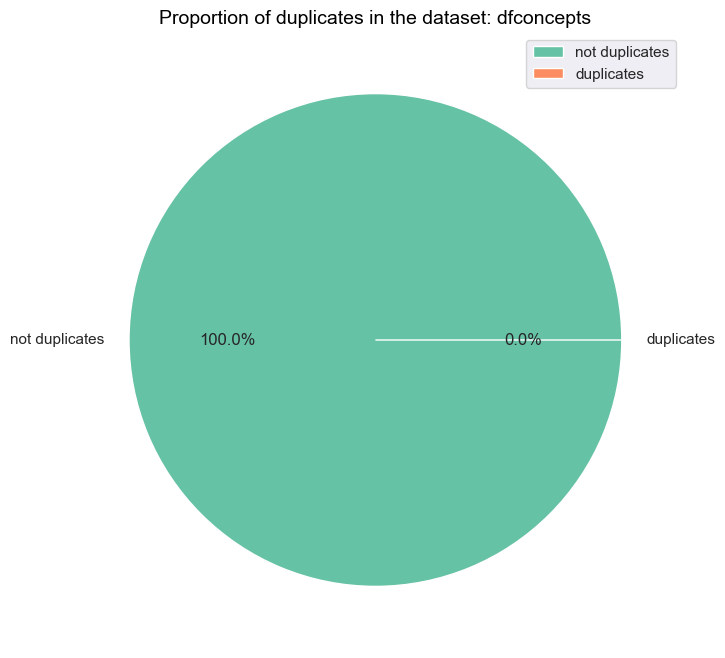

In [87]:
# little fancy visualization for dfconcepts

dfconcepts_noduplicates = dfconcepts.drop_duplicates()

# data to be displayed
data = [len(dfconcepts_noduplicates), len(dfconcepts) - len(dfconcepts_noduplicates)]

# labels for radability and intepretation
labels = ["not duplicates", "duplicates"]

# colors
colors = sns.color_palette("Set2")

# creating the pie chart
plt.pie(data, labels=labels, colors=colors, autopct="%0.1f%%")

# title
plt.title(
    "Proportion of duplicates in the dataset: dfconcepts",
    color="black",  # I am using the 'white' color here, as I am using the 'dark mode' of Jupyter Lab.
    fontsize=14,
)

# legend
plt.legend(bbox_to_anchor=(1, 1))

# calling the pie chart
plt.show()

__Observation__ 

As expected there are no duplicates in my dataset. In fact this is how I constructed this dataset.

<div class="alert-info">
4. We show the proportion of missing values in the data using (i) appropriate visualizations, and (ii) numerical summaries.
</div>

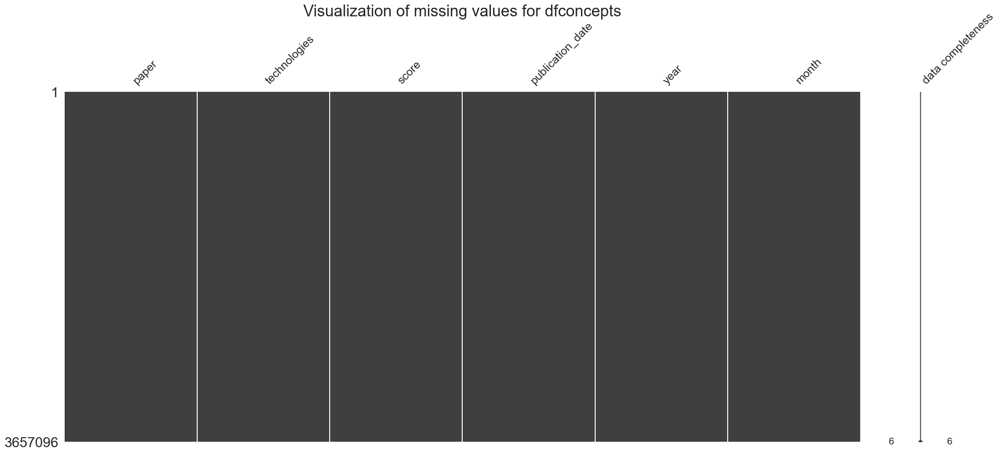

In [88]:
msno.matrix(dfconcepts,labels=True, fontsize=18)
plt.title("Visualization of missing values for dfconcepts",fontsize = 25)
plt.show()

__Observation__ 

As expected there are no missing values in my dataset. In fact this is how I constructed this dataset.

<div class="alert-info">
4. Checking unique values
</div>

In [89]:
unique_values = dfconcepts.select_dtypes(include="object").nunique()
unique_values

paper               135448
technologies            27
score               161227
publication_date      6669
month                   12
dtype: int64

<div class="alert-info">
5. More in depth visualization of my data and its features.
</div>

We first consider the percentage of non-zero score of attribution among all the score of attribution I have (for all papers).

In [90]:
mylist= dfconcepts["score"].tolist()

newlist = [x for x in mylist if x != 0]

print("Many papers are not attributed to any technologies, in fact, the percent of non-zero score is :")
print(str(len(newlist)/len(mylist)*100)+" %")

Many papers are not attributed to any technologies, in fact, the percent of non-zero score is :
4.582433712431941 %


It's good that we have only a small percentage of papers with a non-zero score of attribution to technologies. In fact, this allow us to reduce the number of edges between technologies and to select only the relevant information.

I do now want to visualize the distribution scores of attribution to technologies among the papers or in other words the proportion of papers that have certain scores of attribution.
I first visualize a bar chart in log-scale considering the zero-scores of attribution, and then I visualize a bar chart in normal scale without the zero-scores of attribution.

In [91]:
mylist = [float(x) for x in mylist]
mylist.sort()
# I sort my the number of papers by scores of attribution to technologies
numberpapers= []
for i in range(10):
    specificlist=[x for x in mylist if 0.1*(i+1)>x>=i*0.1]
    numberpapers.append(len(specificlist))
print(numberpapers)

[3495236, 9030, 11756, 9980, 33857, 26926, 21531, 19487, 17842, 11451]


Preparing the labels and ticks for my visualization.

In [92]:
heightbarticks = [2500,5000,10000,15000,25000,50000,100000,250000,500000,10000,1000000,2000000]
heightbarlabels = [str(x) for x in heightbarticks]

We first visualize the number of scores of attribution to technologies among the papers with the zero scores of attribution and then without.

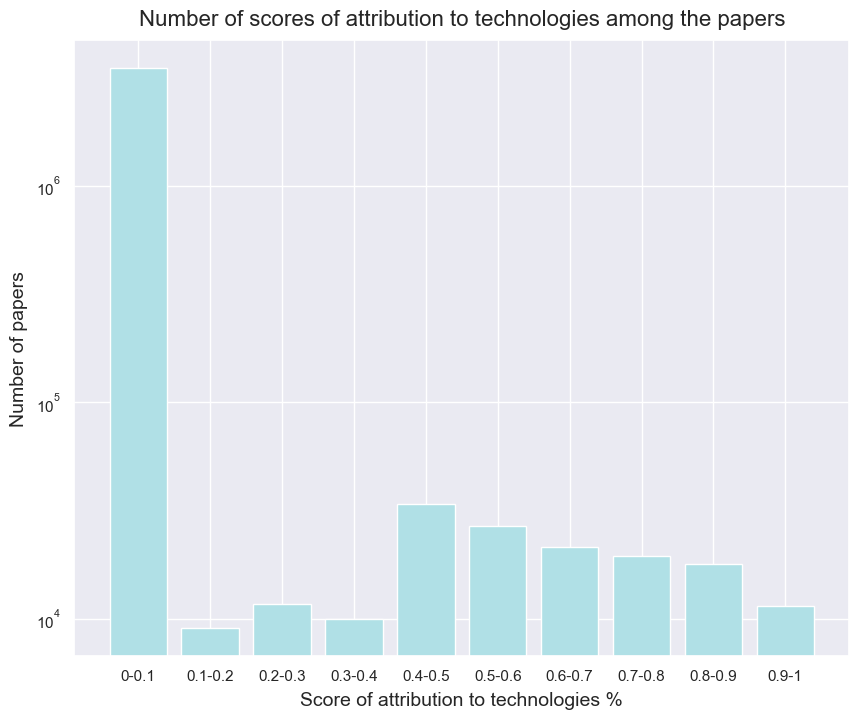

In [93]:
# lables and title specs
label_specs = {"fontsize": 14,"labelpad":6}
title_specs = {"fontsize": 16, "y": 1.01}


# creating the figure and setting its size

f = plt.figure()
f.set_figwidth(10)
f.set_figheight(8)

# score bar chat
# setting the axes of our horizontal bar plot

x_cor = ['0-0.1','0.1-0.2','0.2-0.3','0.3-0.4','0.4-0.5','0.5-0.6','0.6-0.7','0.7-0.8','0.8-0.9','0.9-1']
plt.bar(x_cor, numberpapers, color="powderblue")  
# setting the column of our dataset ('number of papers') that we want to plot as a numerical variable

# setting the labels of our axes
plt.xlabel("Score of attribution to technologies %",**label_specs)
plt.ylabel("Number of papers",**label_specs)

plt.yscale('log')



# setting the bar plot title
plt.title(
    "Number of scores of attribution to technologies among the papers",**title_specs
)

# showing the bar plot (command not necessary, but it avoids to print the explanation text)
plt.show()

__Observations__

As already computed there is a huge amount of zero score of attribution. I am slightly surprised to see significantly less score of attributions between 0.1 and 0.4 than between 0.4 and 1. Nevertheless, the distribution is relatively uniform.

In [94]:
mylist = [float(x) for x in newlist]
mylist.sort()
# I sort my the number of papers by scores of attribution to technologies
numberpapers= []
for i in range(10):
    specificlist=[x for x in mylist if 0.1*(i+1)>x>=i*0.1]
    numberpapers.append(len(specificlist))
print(numberpapers)

[5724, 9030, 11756, 9980, 33857, 26926, 21531, 19487, 17842, 11451]


In [95]:
heightbarticks = [2500,5000,10000,15000,25000,50000,100000,250000,500000,10000,1000000,2000000]
heightbarlabels = [str(x) for x in heightbarticks]

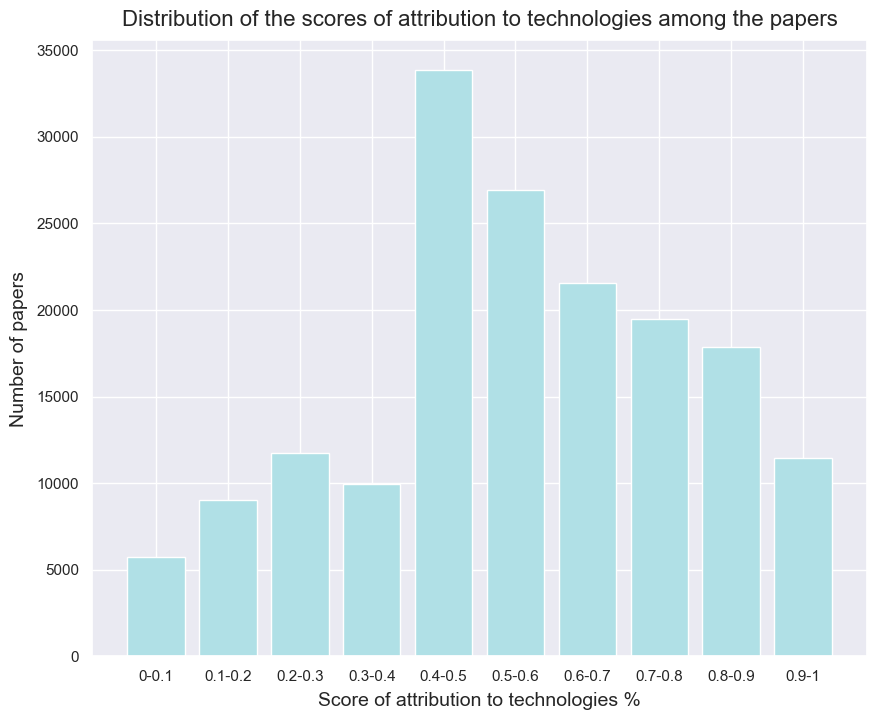

In [96]:
# lables and title specs
label_specs = {"fontsize": 14,"labelpad":6}
title_specs = {"fontsize": 16, "y": 1.01}

# creating the figure and setting its size

f = plt.figure()
f.set_figwidth(10)
f.set_figheight(8)

# score bar chat
# setting the axes of our horizontal bar plot

x_cor = ['0-0.1','0.1-0.2','0.2-0.3','0.3-0.4','0.4-0.5','0.5-0.6','0.6-0.7','0.7-0.8','0.8-0.9','0.9-1']
plt.bar(x_cor, numberpapers, color="powderblue")  
# setting the column of our dataset ('number of papers') that we want to plot as a numerical variable

# setting the labels of our axes
plt.xlabel("Score of attribution to technologies %",**label_specs)
plt.ylabel("Number of papers",**label_specs)


# setting the bar plot title
plt.title(
    "Distribution of the scores of attribution to technologies among the papers",**title_specs
)

# showing the bar plot (command not necessary, but it avoids to print the explanation text)
plt.show()

__Observations__

We see that between 0 and 0.4 (0 not included), there are only few score of attributions while between 0.4 and 1, there is much more score of attributions. As expected, there is a huge peak between 0.4 and 0.5.

We now want to check what are the technologies with no affiliated papers. 

In [97]:
list_concepts= ['Authentication protocole','Biometrics','Blockchain','Differential Privacy','Digital rights management',
'Digital signature','Disk Encryption','Distributed algorithm','Electronic voting','Functional encryption',
'Hardware acceleration','Hardware security module','Hash function','Homomorphic encryption','Identity management',
'Key management','Link encryption','Post-quantum cryptography','Public-key cryptography','Quantum key distribution',
'Quantum cryptography','Random number generation','Symmetric-key algorithm','Threshold cryptosystem',
'Trusted Computing','Tunneling protocol','Zero-knowlegde proof']

In [98]:
# we consider the technologies, with no papers.
for tech in list_concepts:
    newdf = dfconcepts.loc[dfconcepts["technologies"]==tech].copy()
    nonzeropapers = len(newdf.loc[newdf["score"]!=0])
    if nonzeropapers==0:
        print("The technology "+str(tech)+" has absolutely no papers affiliated with it!")
        print("We could then simply drop it from our list of technologies.")
        print("  ")

The technology Differential Privacy has absolutely no papers affiliated with it!
We could then simply drop it from our list of technologies.
  
The technology Disk Encryption has absolutely no papers affiliated with it!
We could then simply drop it from our list of technologies.
  


We now are interested to visualize the number of papers with non-zero score of attribution by technologies (log-scale).

I first compute and sort my data to visualize it later.

In [99]:
# We visualize the number of papers with non-zero score of attribution to technologies

numbertech = len(list_concepts)

numberpapersbytech = []
for tech in list_concepts:
        newdf = dfconcepts.loc[dfconcepts["technologies"]==tech].copy()
        nonzeropapers = len(newdf.loc[newdf["score"]!=0])
        numberpapersbytech.append(nonzeropapers)
        
old_numberpapersbytech =numberpapersbytech.copy()

# I need to sort my data and my labels to visualize everything well.

numberpapersbytech.sort()

newlist_concept = 27*[0]
for i in range(numbertech):
    myelement = old_numberpapersbytech[i]
    myindex = numberpapersbytech.index(myelement)
    newlist_concept[myindex] = list_concepts[i]

newlist_concept[1]='Differential privacy'
newlist_concept[0]='Disk encryption'

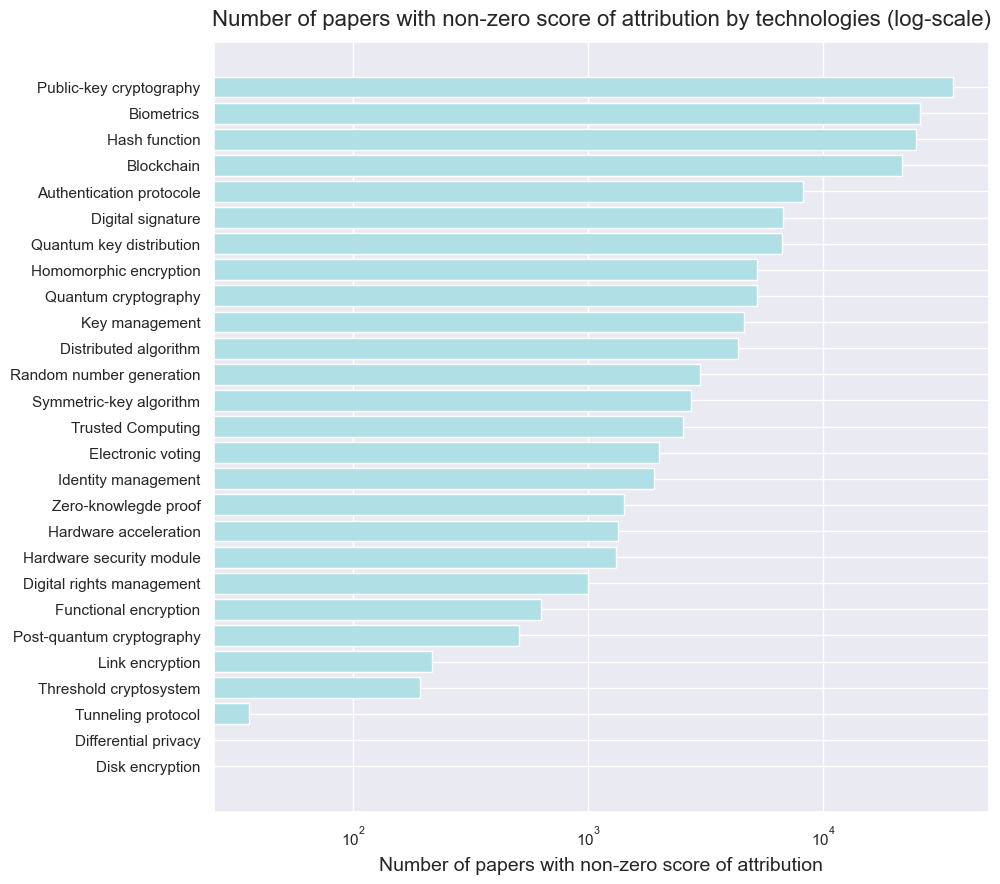

In [100]:
# lables and title specs
label_specs = {"fontsize": 14,"labelpad":6}
title_specs = {"fontsize": 16, "y": 1.01}

numbertech = len(list_concepts)

# setting the size of our figure
f = plt.figure()
f.set_figwidth(10)
f.set_figheight(10)

# setting the axes of our horizontal bar plot
y_cor = np.arange(numbertech)  # setting the number of categories (representing the countries)
plt.barh(
    y_cor, numberpapersbytech, color="powderblue"
)  # setting the column of our dataset ('share_countries') that we want to plot as a numerical variable

# setting the labels of our axes
plt.xlabel("Number of papers with non-zero score of attribution",**label_specs)

# setting how we want our label ticks
plt.xticks()
plt.yticks(y_cor, newlist_concept)
plt.xscale('log')

# setting the bar plot title
plt.title("Number of papers with non-zero score of attribution by technologies (log-scale)",**title_specs)

# showing the bar plot (command not necessary, but it avoids to print the explanation text)
plt.show()

__Observation__ 

We see that some technologies, like blockchain or public key cryptography have a lot of papers affiliated to them. The distribution of the non-zero score is interesting as well, and could be considered for the compuations.
The technologies 'Disk Encryption' and 'Differential privacy' do not seem to be relevant to our studies anymore, since no paper is connected to them with a non-zero score of attribution. 

Now, I visualize the distribution of papers with a non-zero score of attribution to for each technology from 2012 to 2022.

In [101]:
dfconcepts

,paper,technologies,score,publication_date,year,month
0,https://openalex.org/W2885223756,Authentication protocole,0,2018-08-16,2018,August
1,https://openalex.org/W2885223756,Biometrics,0,2018-08-16,2018,August
2,https://openalex.org/W2885223756,Blockchain,0.92650795,2018-08-16,2018,August
3,https://openalex.org/W2885223756,Differential Privacy,0,2018-08-16,2018,August
4,https://openalex.org/W2885223756,Digital rights management,0.714638,2018-08-16,2018,August
...,...,...,...,...,...,...
3657091,https://openalex.org/W4214588288,Symmetric-key algorithm,0,2021-10-01,2021,October
3657092,https://openalex.org/W4214588288,Threshold cryptosystem,0,2021-10-01,2021,October
3657093,https://openalex.org/W4214588288,Trusted Computing,0,2021-10-01,2021,October
3657094,https://openalex.org/W4214588288,Tunneling protocol,0,2021-10-01,2021,October


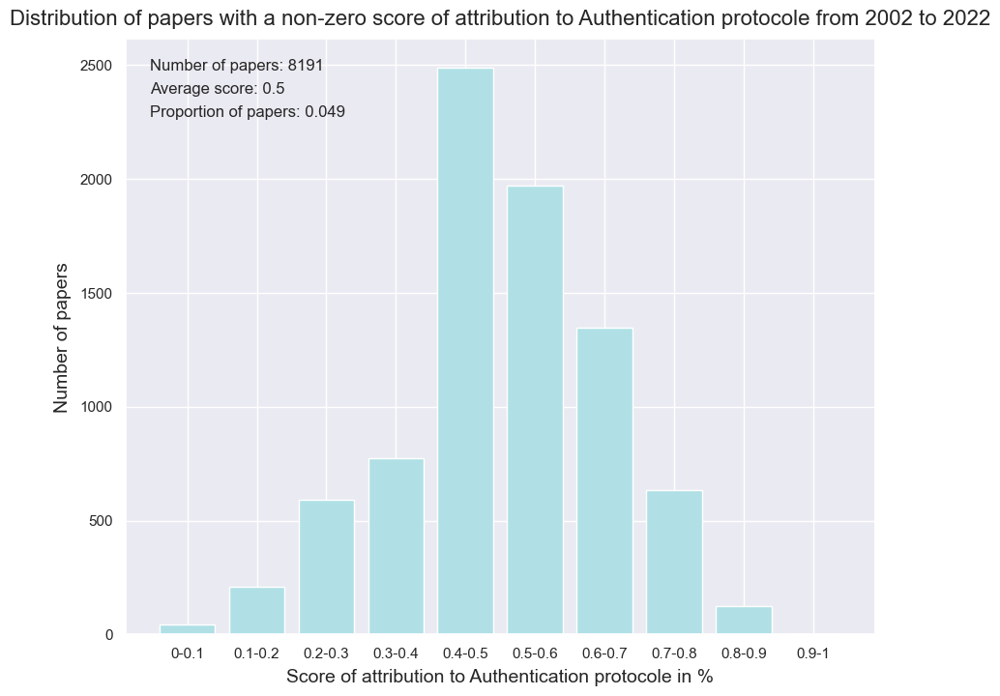

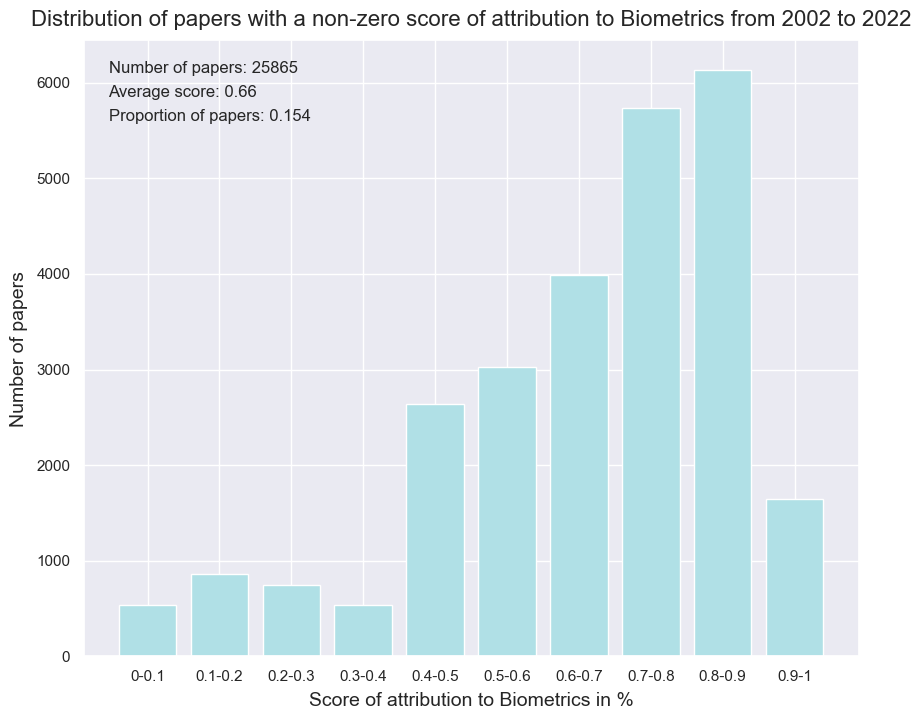

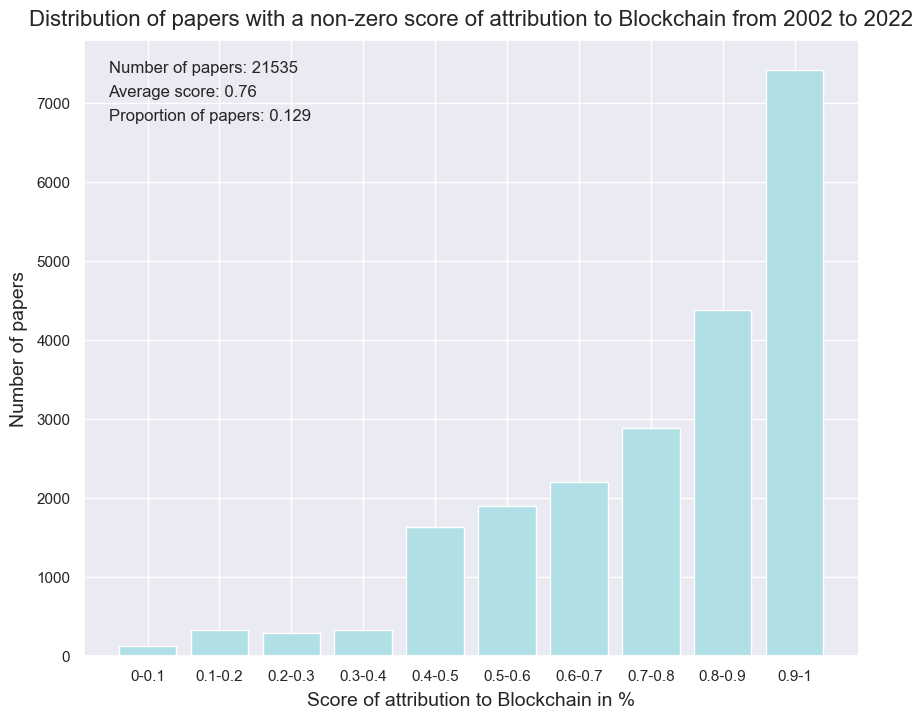

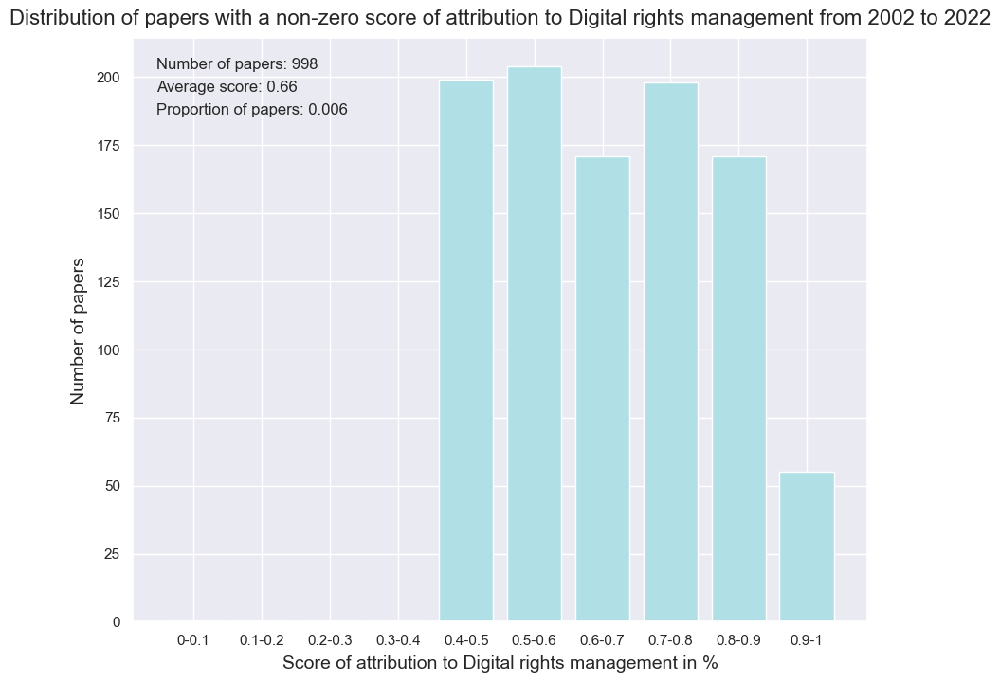

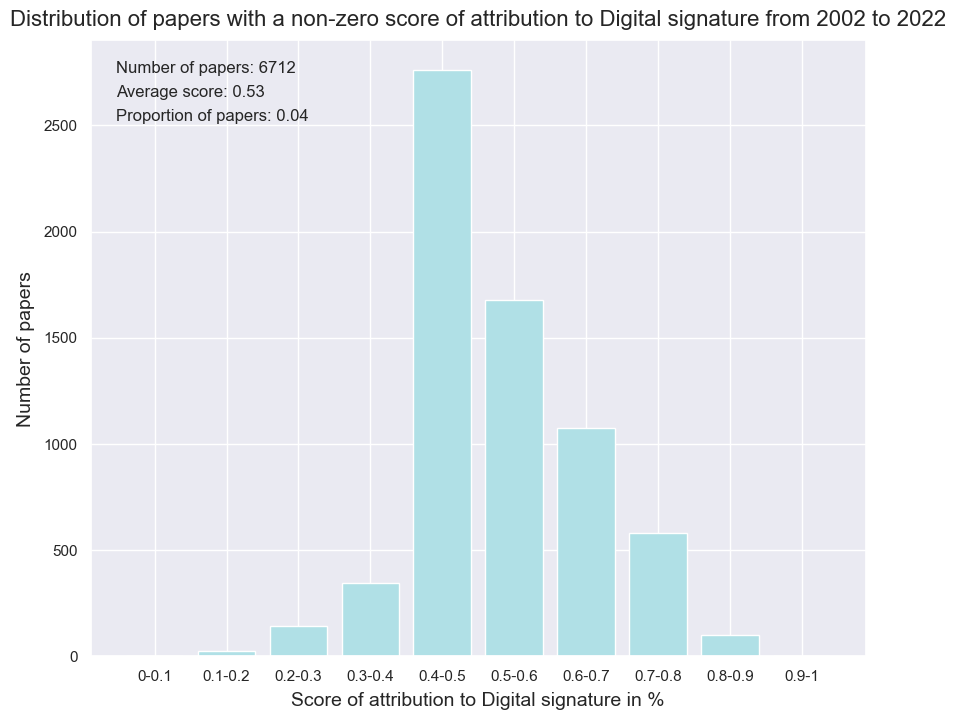

...

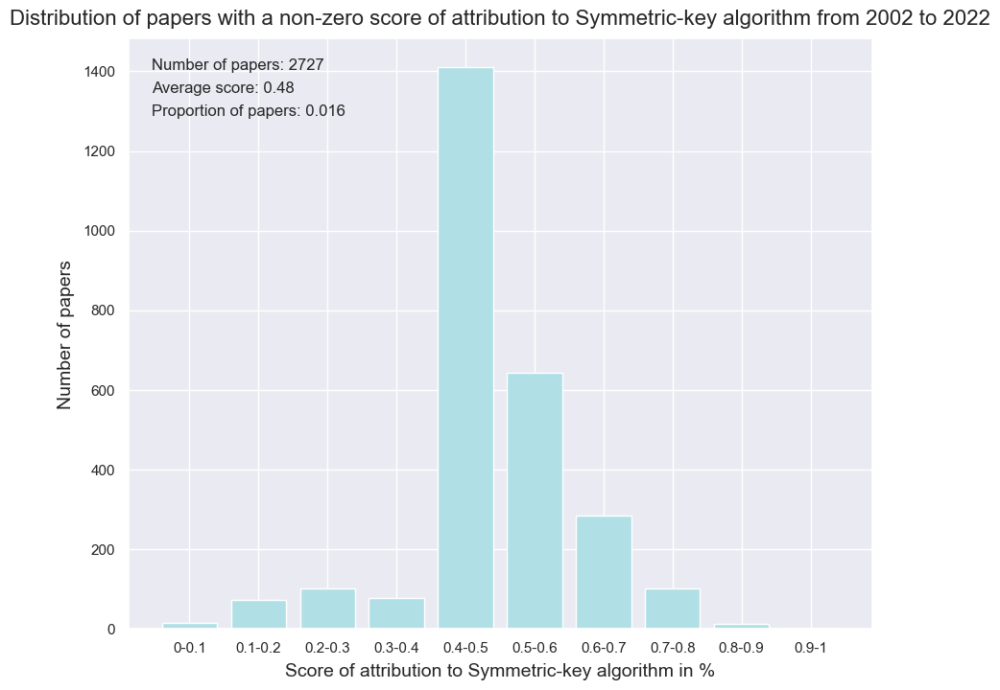

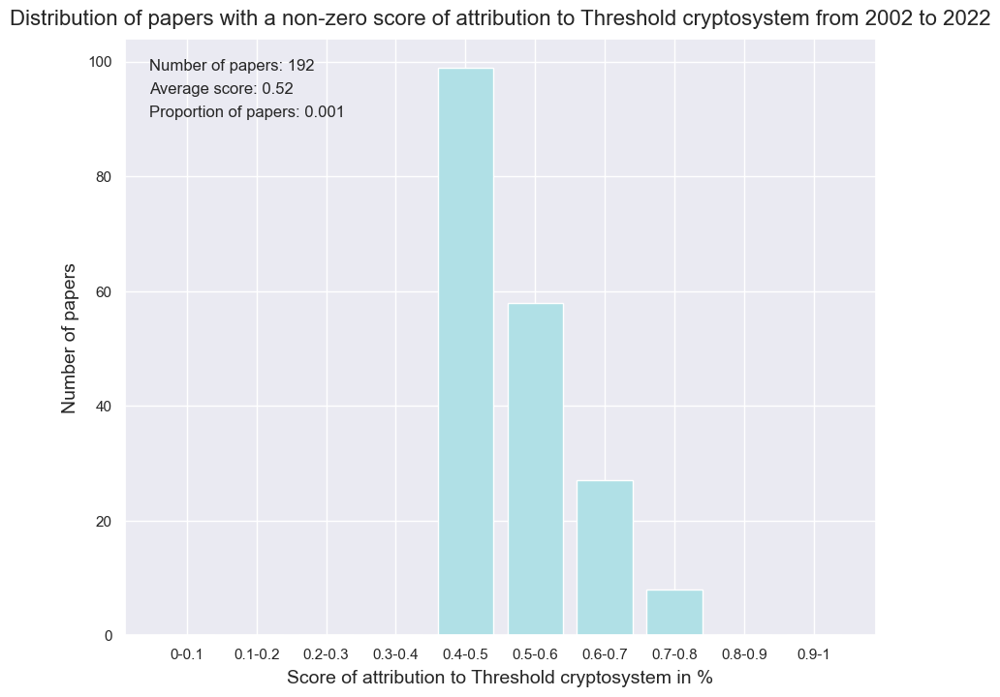

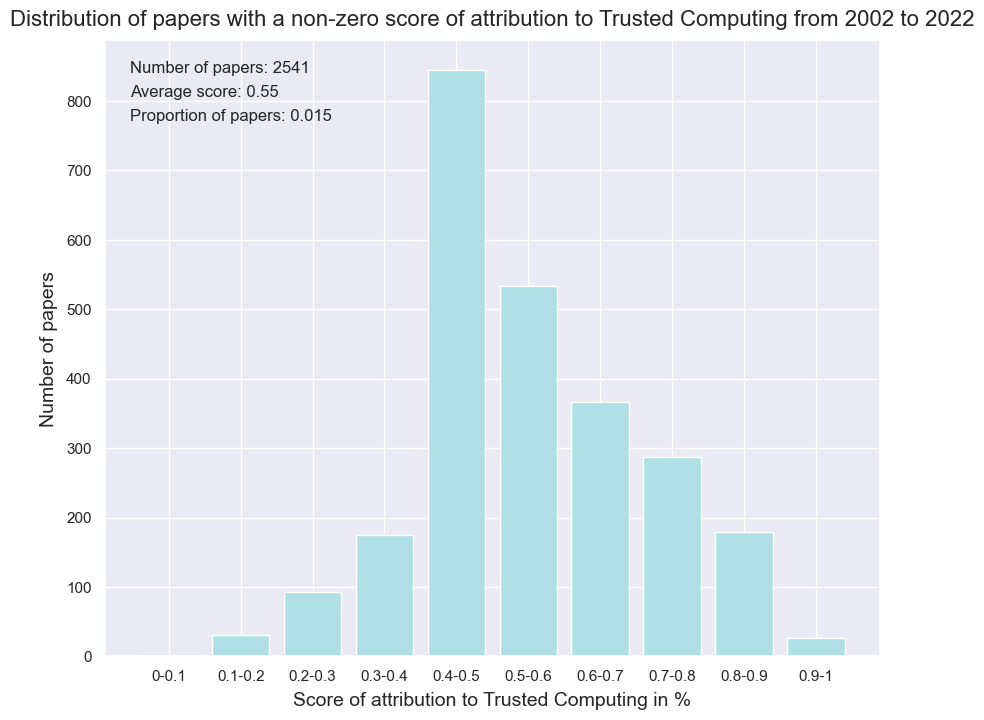

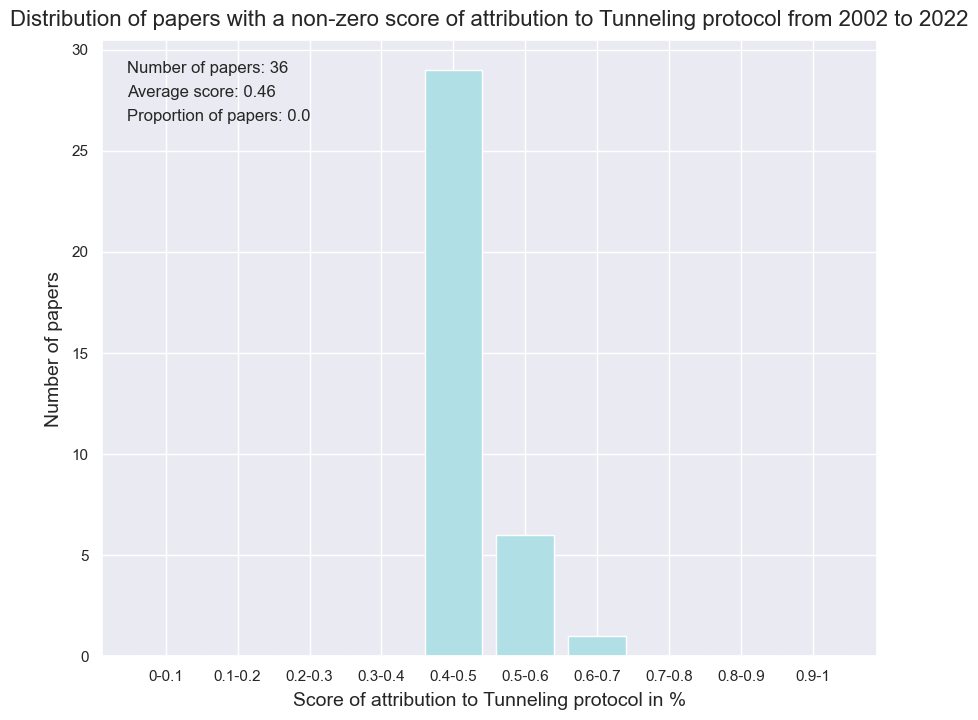

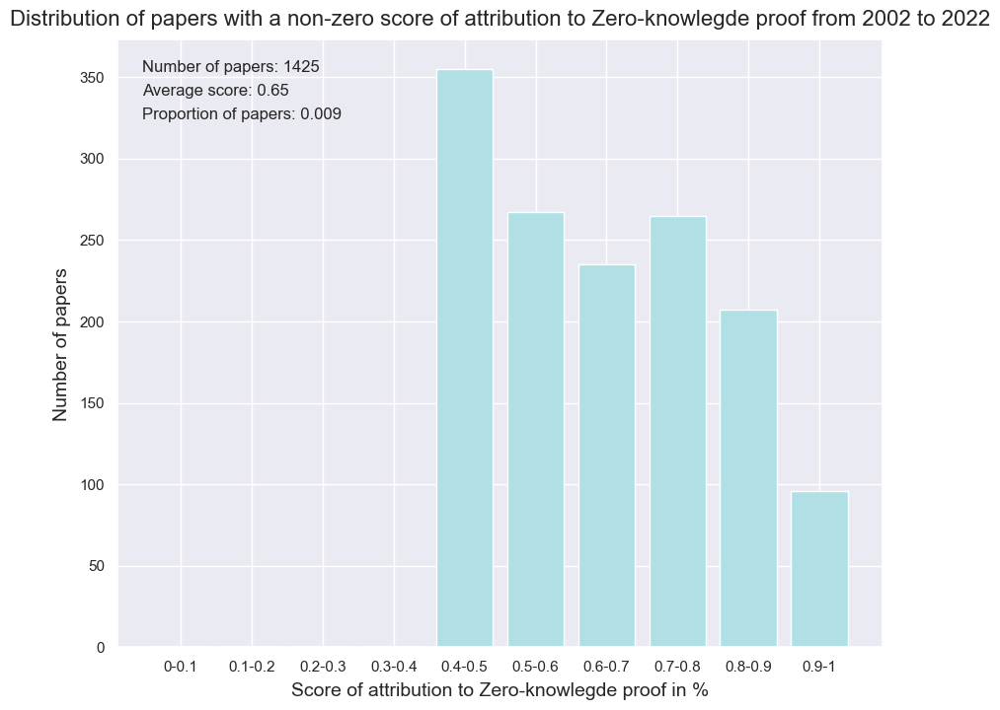

In [102]:
# lables and title specs
label_specs = {"fontsize": 14,"labelpad":6}
title_specs = {"fontsize": 16, "y": 1.01}

# we take only the elements where there is effectively something to be visualized
list_concepts_withpapers=[x for x in list_concepts if x not in ['Differential Privacy','Disk Encryption']]

number_nonzeroscore = 0
for tech in list_concepts_withpapers:
    newdf = dfconcepts.loc[dfconcepts["technologies"]==tech].copy()
    # I do not consider the papers with score of attribution 0, since they are not interesting.
    nonzeropapers = newdf.loc[newdf["score"]!=0].copy()
    number_nonzeroscore = len(nonzeropapers)+number_nonzeroscore
    
for tech in list_concepts_withpapers:
    # creating the figure and setting its size
    newdf = dfconcepts.loc[dfconcepts["technologies"]==tech].copy()
    # I do not consider the papers with score of attribution 0, since they are not interesting.
    nonzeropapers = newdf.loc[newdf["score"]!=0].copy()
    mynumberpapers = len(nonzeropapers)
    # I do a list with all the scores
    mylist = nonzeropapers.score.tolist()
    mylist = [float(x) for x in mylist]
    # we compute the average:
    average_score = round(sum(mylist) / len(mylist),2)
    # I sort my the number of papers by scores of attribution to technologies
    numberpapers= []
    for i in range(10):
        specificlist=[x for x in mylist if 0.10000000001*(i+1)>x>=i*0.1]
        numberpapers.append(len(specificlist))
    
    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(8)

    # score bar chat
    # setting the axes of our horizontal bar plot

    x_cor = ['0-0.1','0.1-0.2','0.2-0.3','0.3-0.4','0.4-0.5','0.5-0.6','0.6-0.7','0.7-0.8','0.8-0.9','0.9-1']
    plt.bar(x_cor, numberpapers, color="powderblue")  
    # setting the column of our dataset ('number of papers') that we want to plot as a numerical variable

    # setting the labels of our axes
    plt.xlabel("Score of attribution to "+str(tech)+" in %",**label_specs)
    plt.ylabel("Number of papers",**label_specs)

    # setting how we want our label ticks
    #plt.yticks(heightbarticks,heightbarlabels)

    # setting the bar plot title
    plt.title("Distribution of papers with a non-zero score of attribution to "+str(tech)+" from 2002 to 2022",**title_specs)


    plt.figtext(0.15, 0.81, "Average score: "+str(average_score), fontsize=12)
    plt.figtext(0.15, 0.84, "Number of papers: "+str(mynumberpapers), fontsize=12)
    plt.figtext(0.15, 0.78, "Proportion of papers: "+str(round(mynumberpapers/number_nonzeroscore,3)), fontsize=12)
    # this computes the number of papers affiliated to this technology with non-zero score, compared to all the times 
    # we have papers with non-zero score of attribution to a technology.
    # this measures a bit the impact of a technology, but of course this is not enough
    # the average score is an important information as well!
    # showing the bar plot (command not necessary, but it avoids to print the explanation text)
    plt.show()

__Observation__

We can observe that every concept has a different distribution of non-zero score of attribution. The only pattern that repeats itself is that the category 0.4-0.5 represents a big peak for most of the concepts.

__Average score of attribution for all papers related to a technology__

Now, we compute and visualize the average score of attribution for all papers related to a technology for each technology.

We first need to compute the data and then to sort it appropriately.

In [103]:
list_average_score = []

for tech in list_concepts:
    # creating the figure and setting its size
    newdf = dfconcepts.loc[dfconcepts["technologies"]==tech].copy()
    # I do not consider the papers with score of attribution 0, since they are not interesting.
    nonzeropapers = newdf.loc[newdf["score"]!=0].copy()
    mynumberpapers = len(nonzeropapers)
    if mynumberpapers==0:
        average_score = 0
    else:
        # I do a list with all the scores
        mylist = nonzeropapers.score.tolist()
        mylist = [float(x) for x in mylist]
        # we compute the average:
        average_score = sum(mylist) / len(mylist)
        # I sort my the number of papers by scores of attribution to technologies
    list_average_score.append(average_score)


old_list_average_score =list_average_score.copy()

# I need to sort my data and my labels to visualize everything well.

list_average_score.sort()

newlist_concept = 27*[0]
for i in range(numbertech):
    myelement = old_list_average_score[i]
    myindex = list_average_score.index(myelement)
    newlist_concept[myindex] = list_concepts[i]

newlist_concept[1]='Differential privacy'

I could round my average if I want.

In [104]:
#list_average_score = [round(x,2) for x in list_average_score]

Now, I visualize my data.

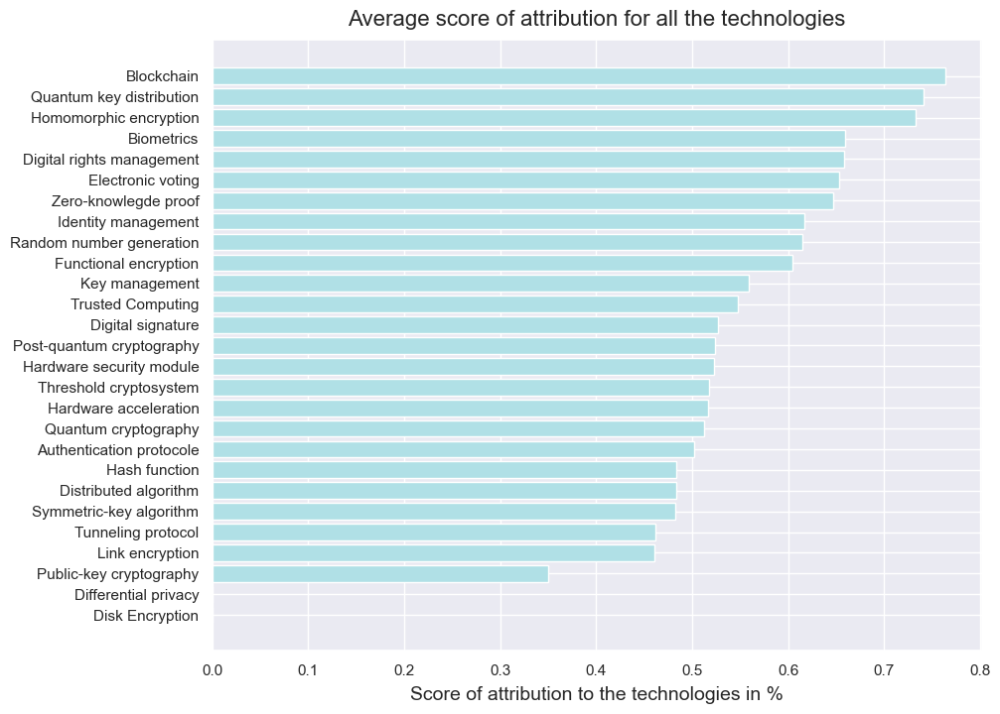

In [105]:
# lables and title specs
label_specs = {"fontsize": 14,"labelpad":6}
title_specs = {"fontsize": 16, "y": 1.01}

f = plt.figure()
f.set_figwidth(10)
f.set_figheight(8)

# score bar chat
# setting the axes of our horizontal bar plot

y_cor = newlist_concept
plt.barh(
    y_cor, list_average_score, color="powderblue"
) 

# setting the column of our dataset ('number of papers') that we want to plot as a numerical variable

# setting the labels of our axes
plt.xlabel("Score of attribution to the technologies in %",**label_specs)

# setting how we want our label ticks
#plt.yticks(heightbarticks,heightbarlabels)

# setting the bar plot title
plt.title("Average score of attribution for all the technologies",**title_specs)

# this computes the number of papers affiliated to this technology with non-zero score, compared to all the times 
# we have papers with non-zero score of attribution to a technology.
# this measures a bit the impact of a technology, but of course this is not enough
# the average score is an important information as well!
# showing the bar plot (command not necessary, but it avoids to print the explanation text)
plt.show()

__Observation__

We see that some technologies that had a lot of papers have a low average score of attribution like public-key cryptography. This might be the case that many researchers connect what they do to this field without going very in depth into it. Besides some technologies that had only few papers like zero-knowledge proof have a high average score of attribution. This is definitely interesting!

We visualize the distribution of the number of papers by year with a non-zero score of attribution to a technology for each technology.

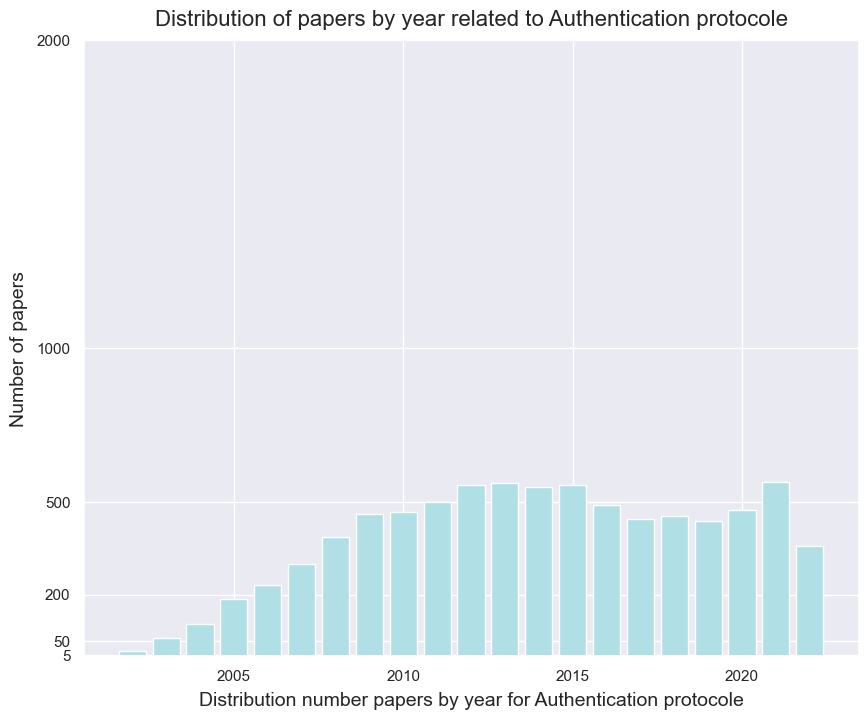

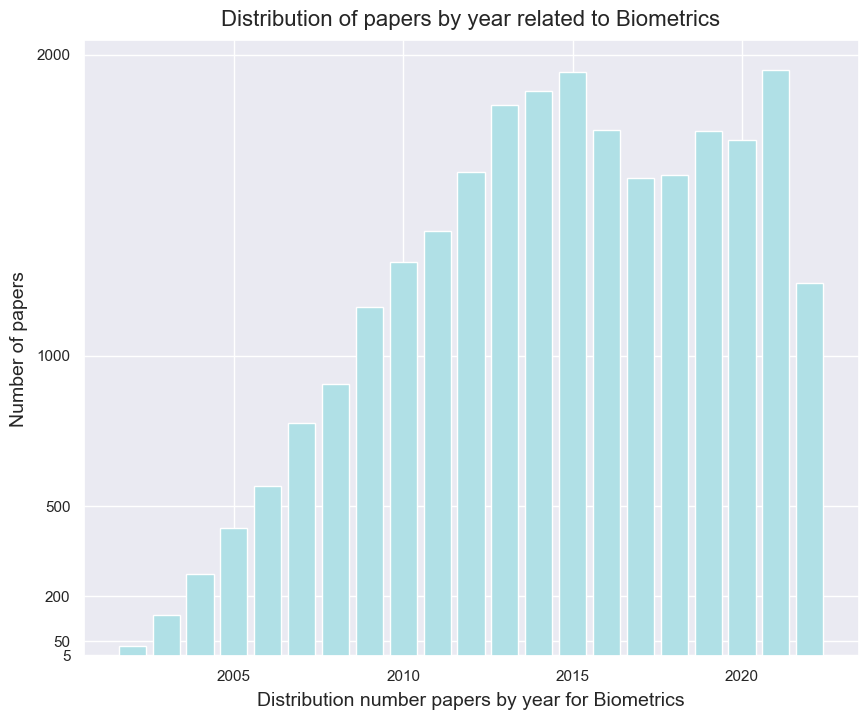

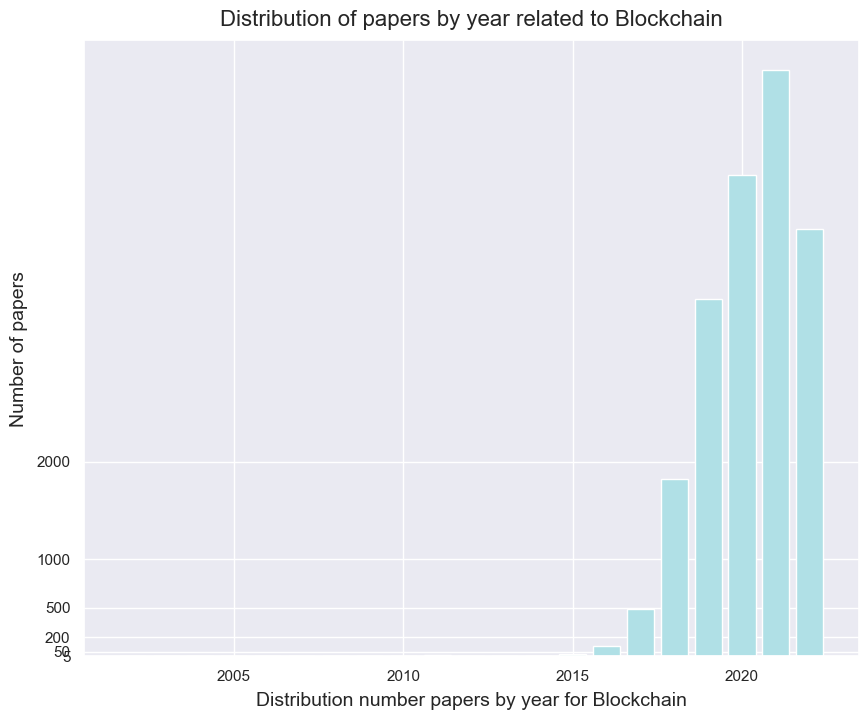

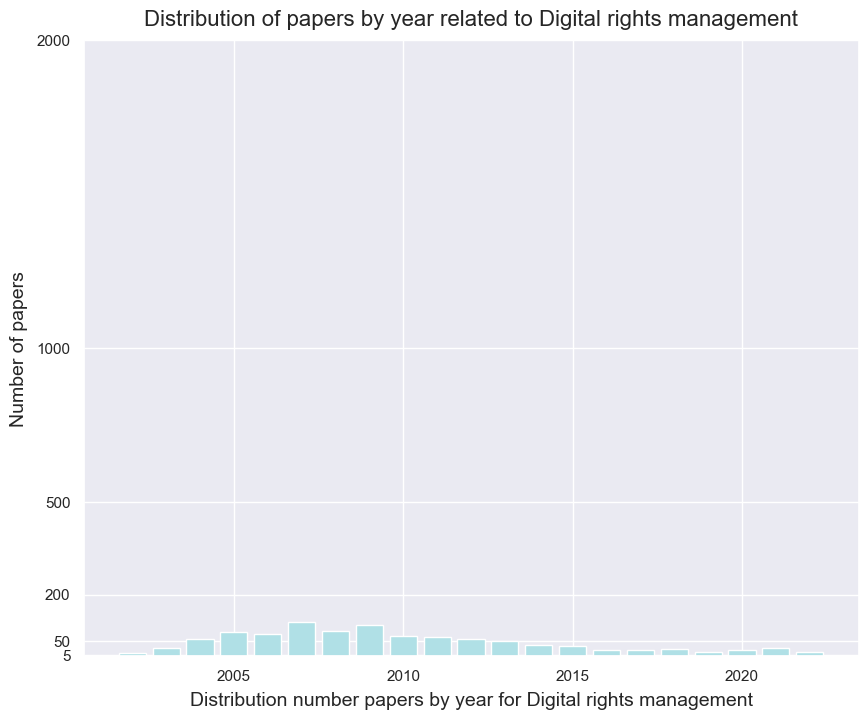

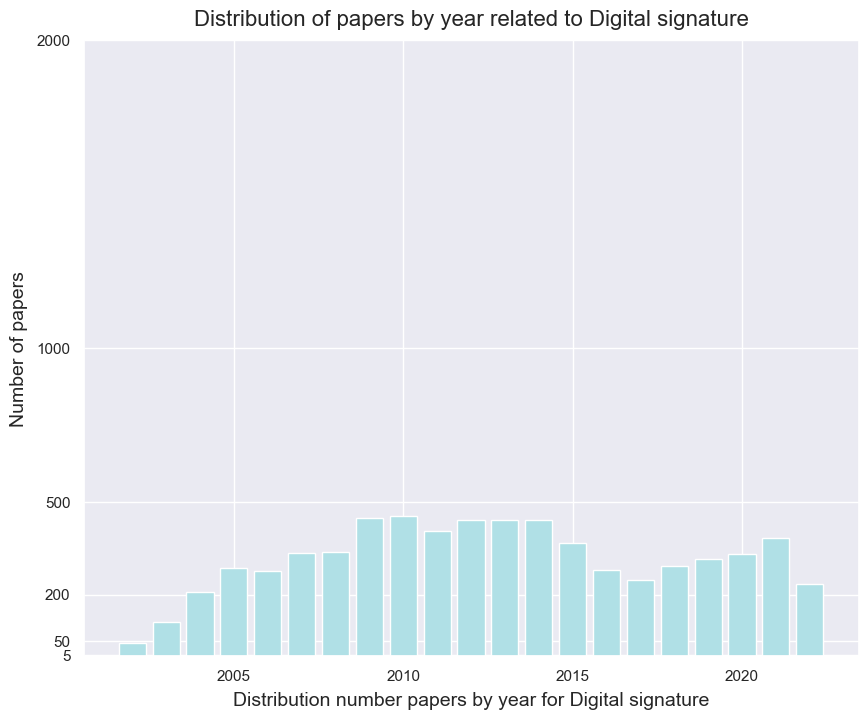

...

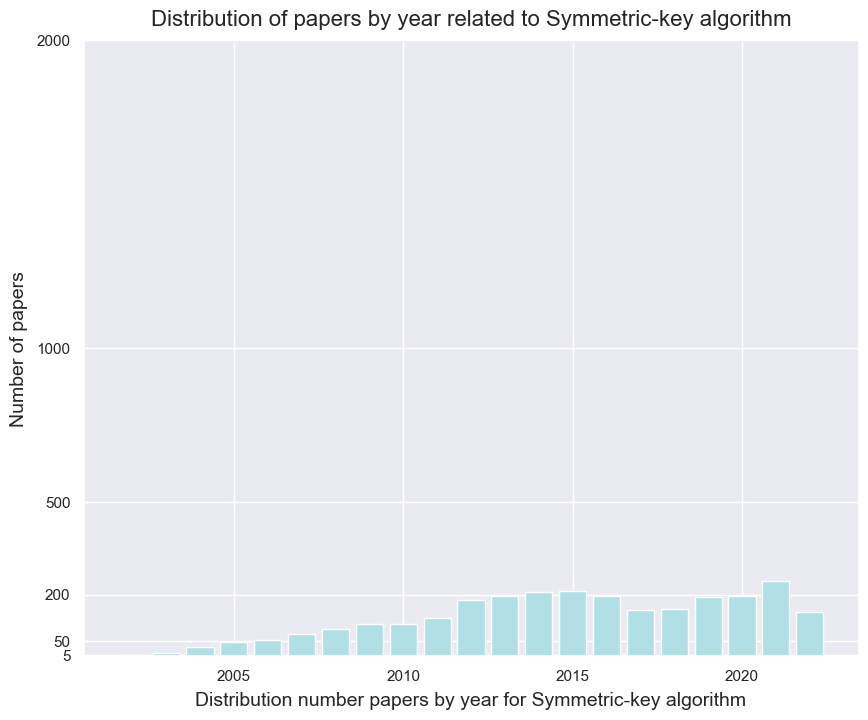

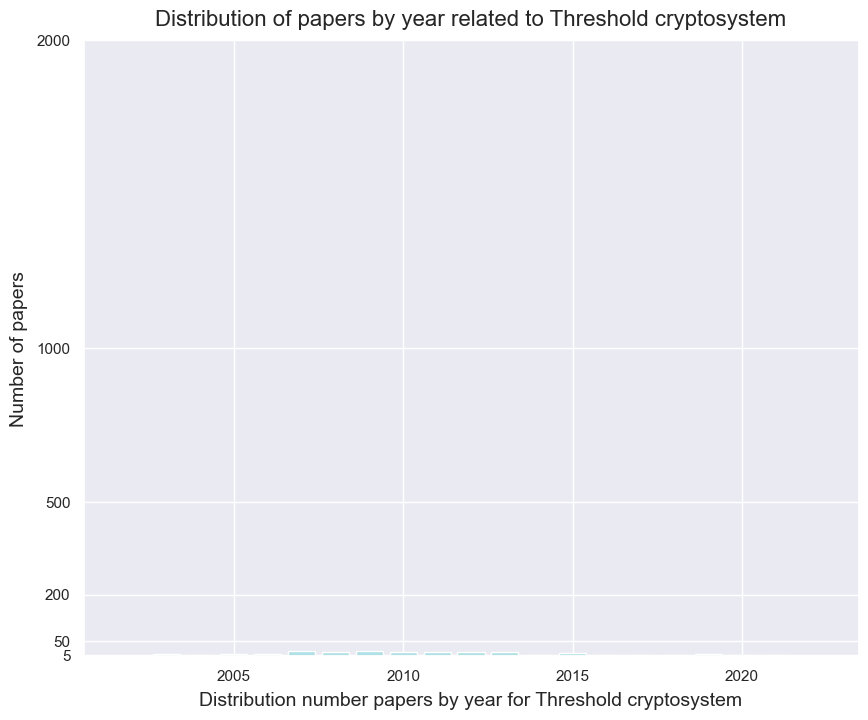

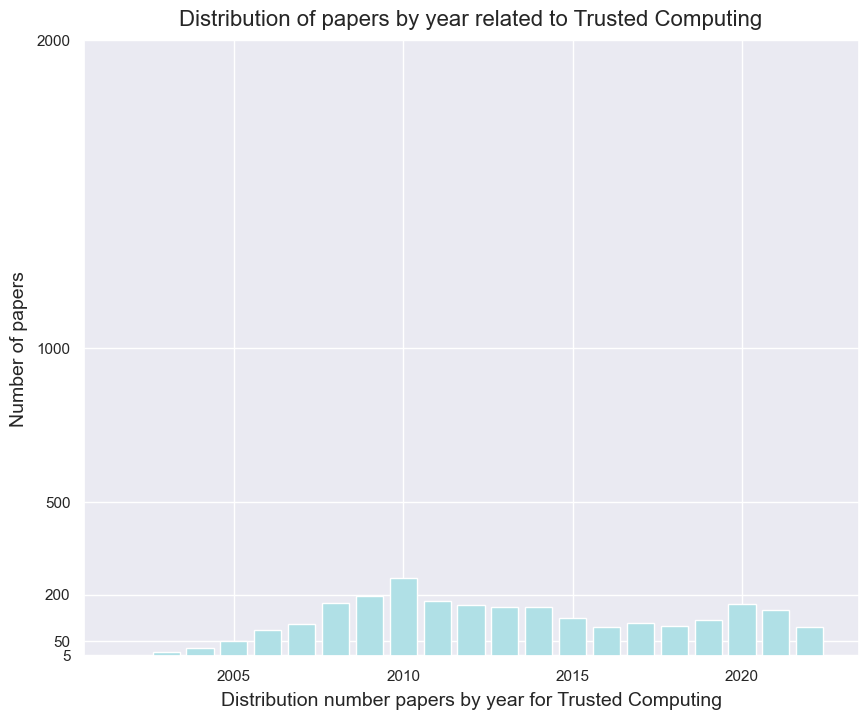

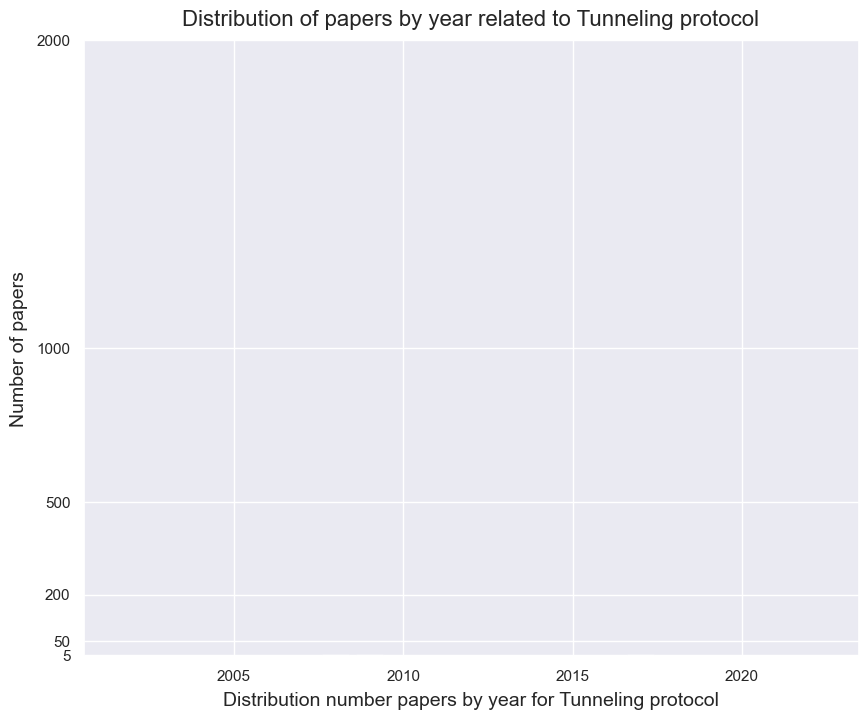

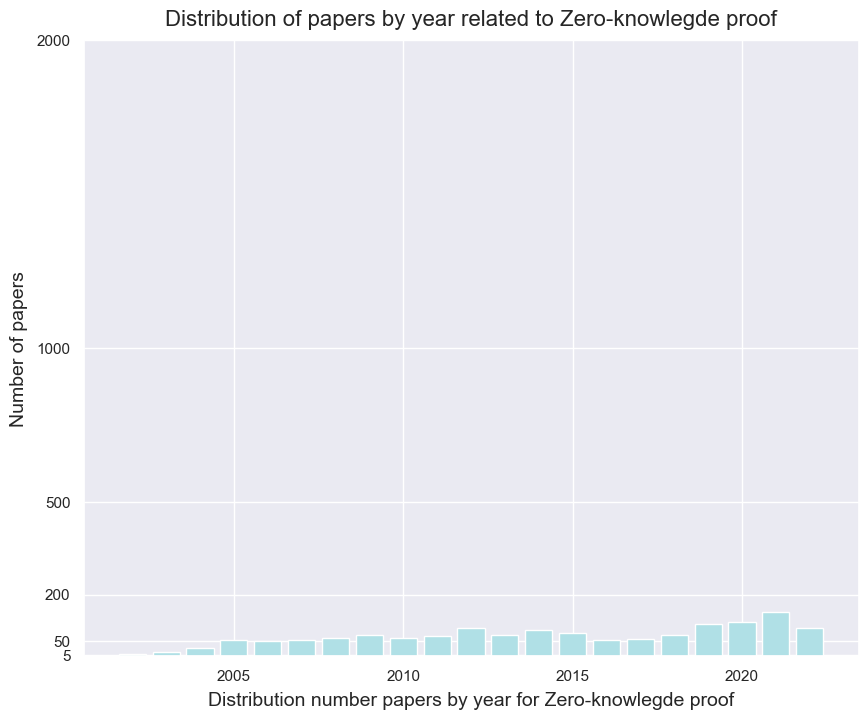

In [106]:
# lables and title specs
label_specs = {"fontsize": 14,"labelpad":6}
title_specs = {"fontsize": 16, "y": 1.01}

# we take only the elements where there is effectively something to be visualized
list_concepts_withpapers=[x for x in list_concepts if x not in ['Differential Privacy','Disk Encryption']]

my_years = [2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022]
heightbarticks =[5,50,200,500,1000,2000]
heightbarlabels = [str(x) for x in heightbarticks]
    
for tech in list_concepts_withpapers:
    newdf = dfconcepts.loc[dfconcepts["technologies"]==tech].copy()
    nonzeropapers = newdf.loc[newdf["score"]!=0].copy()
    numberpaper_year= []
    for year in my_years:
        numberpaper = len(nonzeropapers.loc[nonzeropapers['year']==year])
        numberpaper_year.append(numberpaper)

    f = plt.figure()
    f.set_figwidth(10)
    f.set_figheight(8)

    # score bar chat
    # setting the axes of our horizontal bar plot

    plt.bar(my_years, numberpaper_year, color="powderblue")  
    # setting the column of our dataset ('number of papers') that we want to plot as a numerical variable

    # setting the labels of our axes
    plt.xlabel("Distribution number papers by year for "+str(tech),**label_specs)
    plt.ylabel("Number of papers",**label_specs)
    
    plt.yticks(heightbarticks,heightbarlabels)
    
    # setting the bar plot title
    plt.title("Distribution of papers by year related to "+str(tech),**title_specs)

    # this computes the number of papers affiliated to this technology with non-zero score, compared to all the times 
    # we have papers with non-zero score of attribution to a technology.
    # this measures a bit the impact of a technology, but of course this is not enough
    # the average score is an important information as well!
    # showing the bar plot (command not necessary, but it avoids to print the explanation text)
    plt.show()

__Observations__

Many technologies have very different distribution of the number of papers related to them over all the years. We can observe a huge increase by 'Blockchain'. Overall, the number of papers related to each technology is either stable or growing. Nonetheless, we will see in the pie chart below that in proportion some fields are gaining a lot of of importance while other decrease in importance.

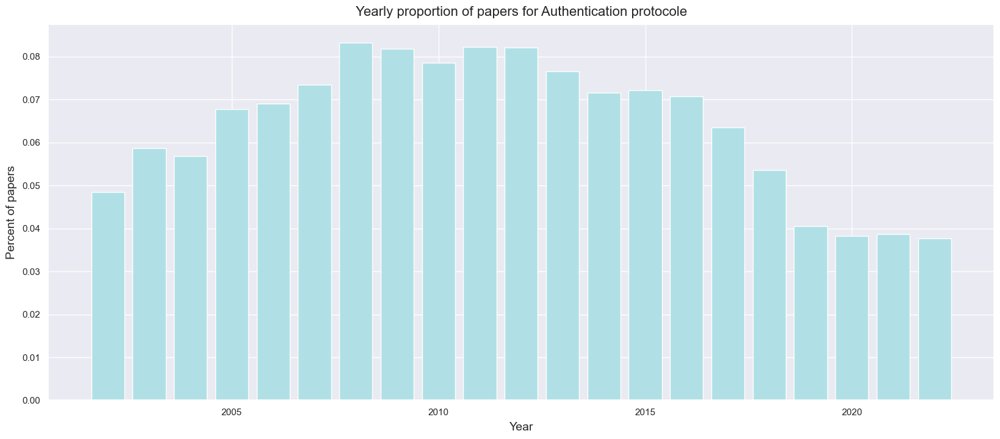

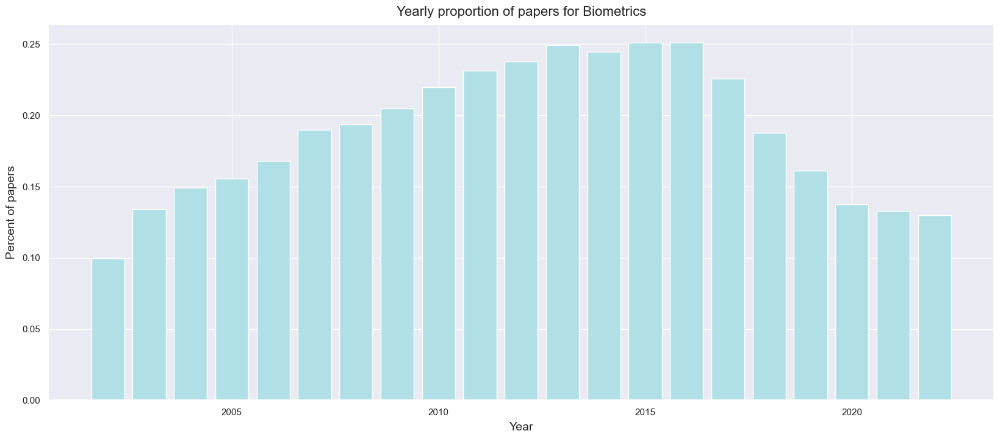

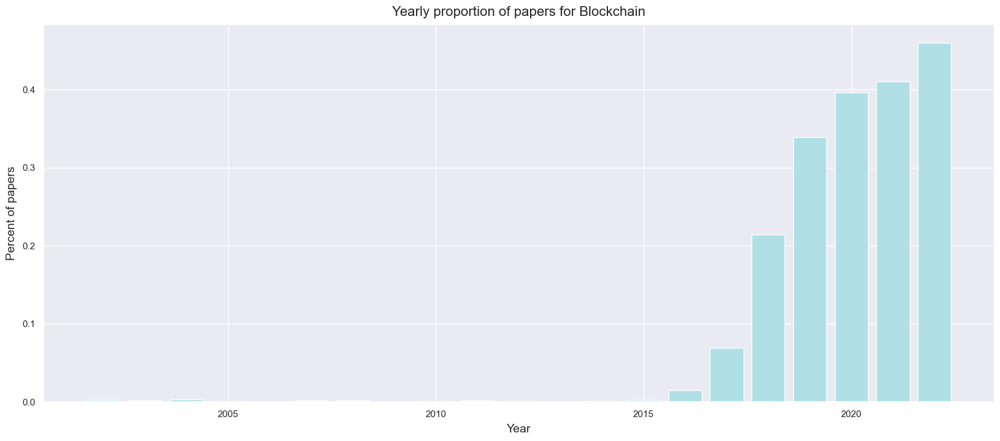

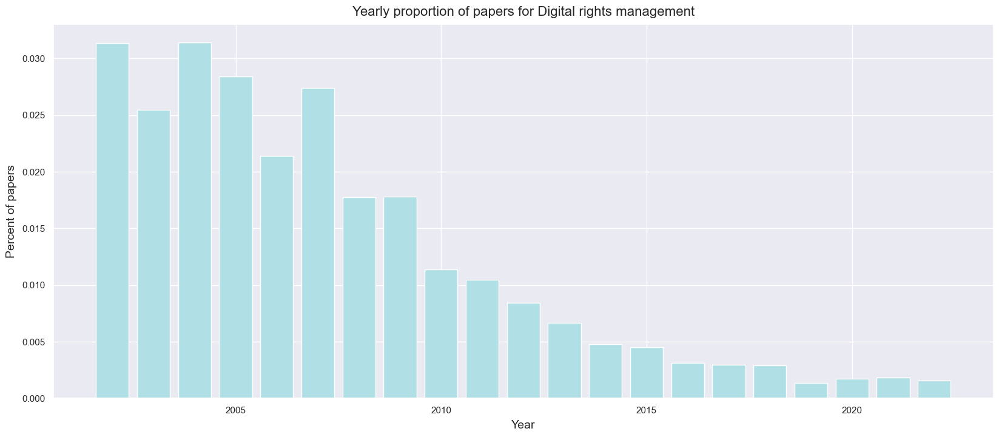

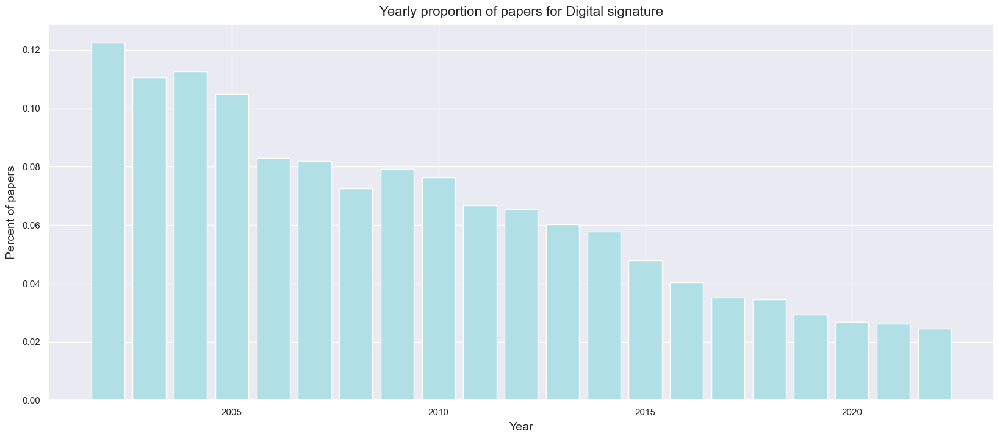

...

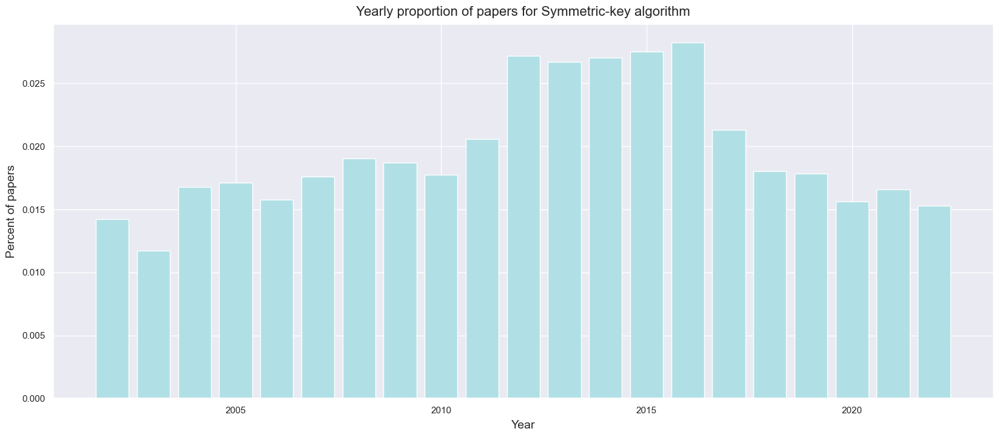

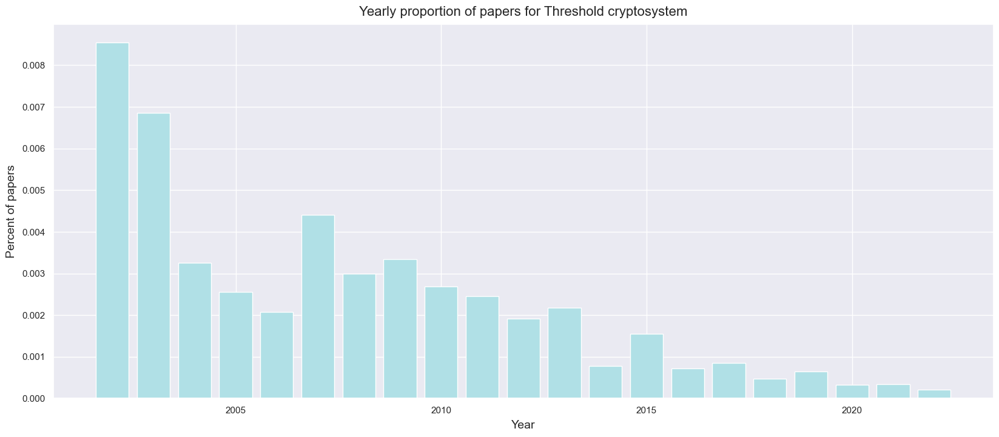

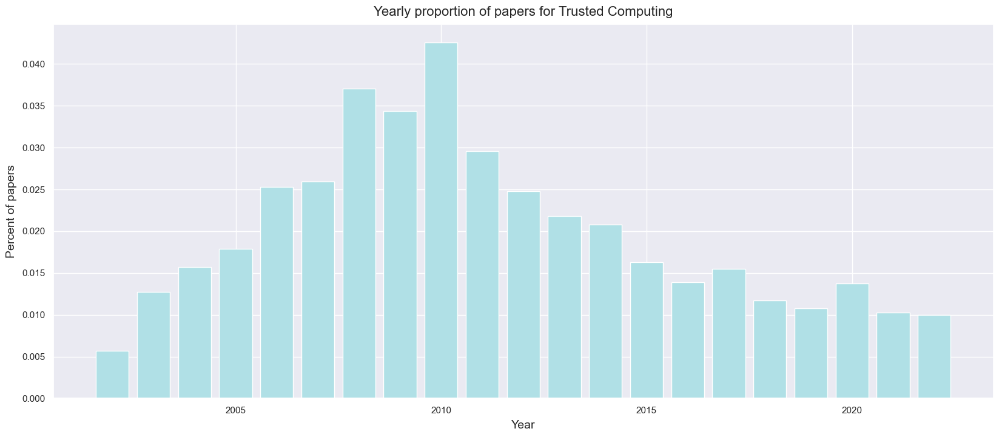

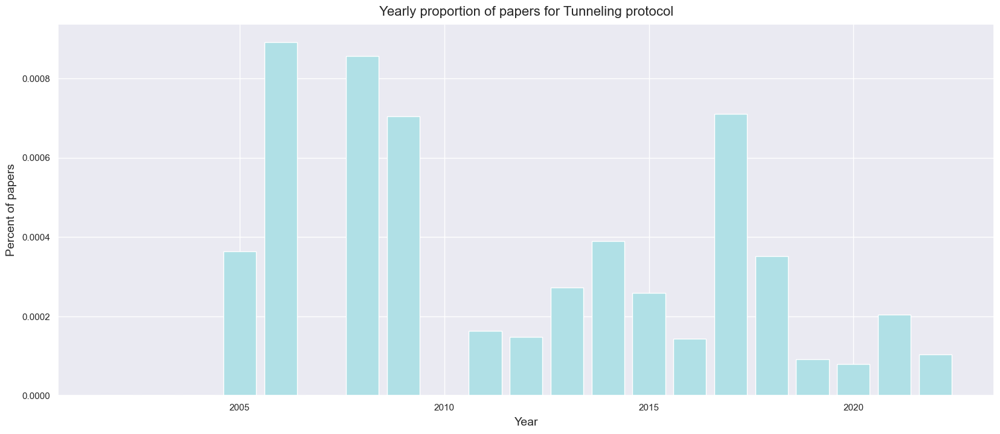

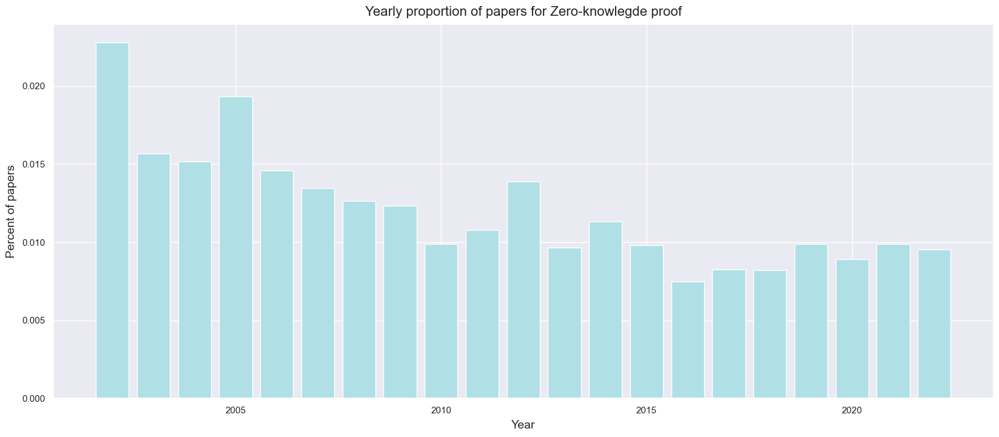

In [107]:
# lables and title specs
label_specs = {"fontsize": 14,"labelpad":6}
title_specs = {"fontsize": 16, "y": 1.01}


# little visualization in bar charts of the proportion of distribution of the publication of papers over all the years

list_concepts_withpapers=[x for x in list_concepts if x not in ['Differential Privacy','Disk Encryption']]

my_years = [2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022]
x_cor = [str(x) for x in my_years]

for tech in list_concepts_withpapers:
    dftech = dfconcepts.loc[dfconcepts["technologies"]==tech].copy()
    proportion_by_year = []
    for year in my_years:
        dfyear = dfconcepts.loc[dfconcepts["year"]==year].copy()
        numberpapers_year = len(list(set(dfyear.paper.tolist())))
        
        dftech_year = dftech.loc[dftech["year"]==year].copy()
        newdf = dftech_year.loc[dftech_year["score"]!=0].copy()
        numberpapers_tech = len(list(set(newdf.paper.tolist())))
        proportion_by_year.append(numberpapers_tech/numberpapers_year)    

    plt.bar(my_years, proportion_by_year, color="powderblue")  
    # setting the column of our dataset ('number of papers') that we want to plot as a numerical variable

    # setting the labels of our axes
    plt.xlabel("Year",**label_specs)
    plt.ylabel("Percent of papers",**label_specs)
    
    
    # setting the bar plot title
    plt.title("Yearly proportion of papers for "+str(tech),**title_specs)

    # this computes the number of papers affiliated to this technology with non-zero score, compared to all the times 
    # we have papers with non-zero score of attribution to a technology.
    # this measures a bit the impact of a technology, but of course this is not enough
    # the average score is an important information as well!
    # showing the bar plot (command not necessary, but it avoids to print the explanation text)
    plt.show()

__Observation__

We can see that Blockchain increased almost exponentially to reach more than 40% of the number of published papers in the field of encryption technologies in 2022. Hardware acceleration also in increased a lot and quantum cryptography as well. Besides these technologies, most of the technologies remained constant or decreased in importance (in percent of all the published papers for the year).

I visualize the same information but in pie charts, to see visually how the situtation evolves from year to year.

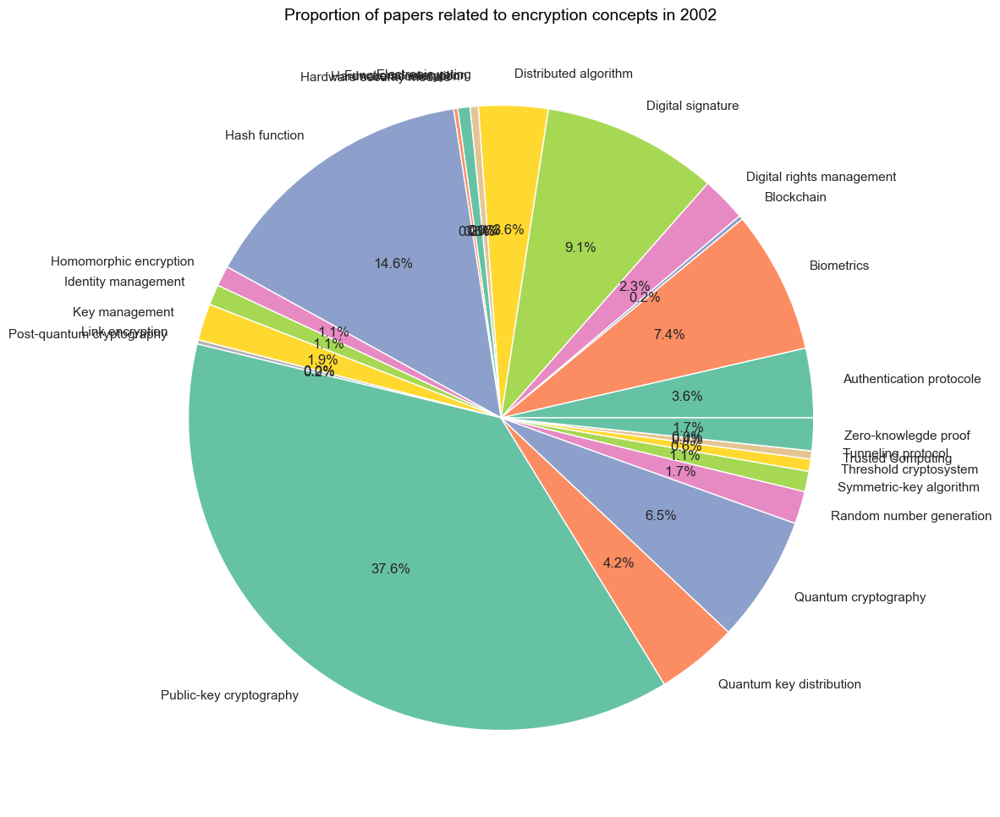

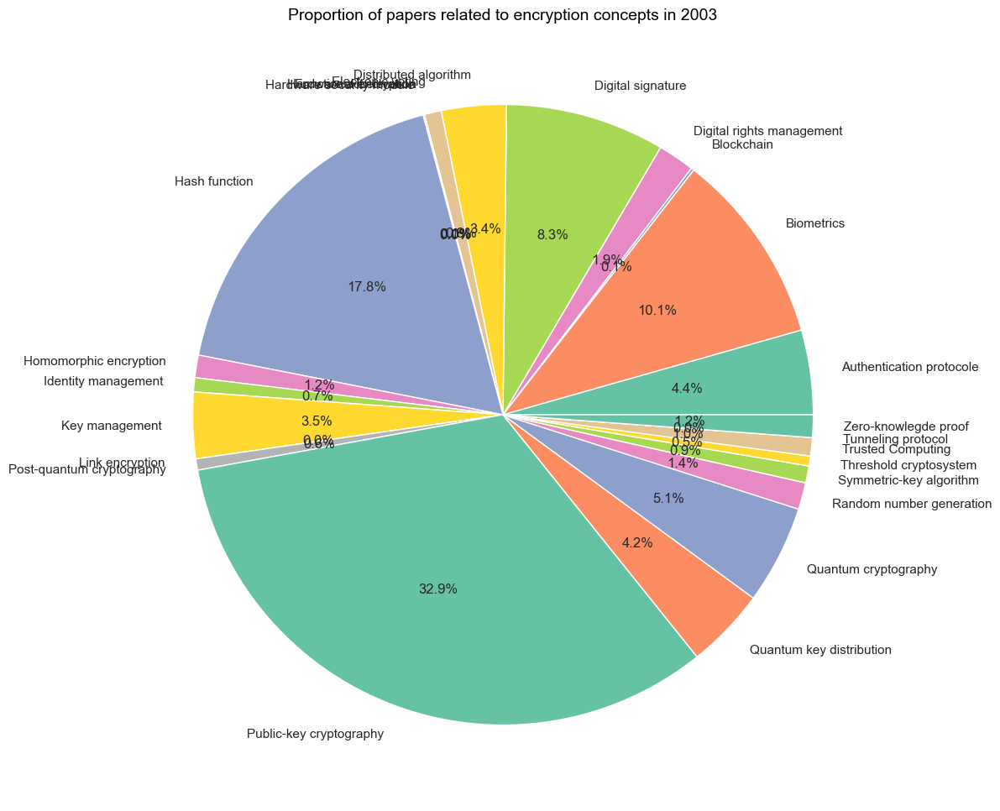

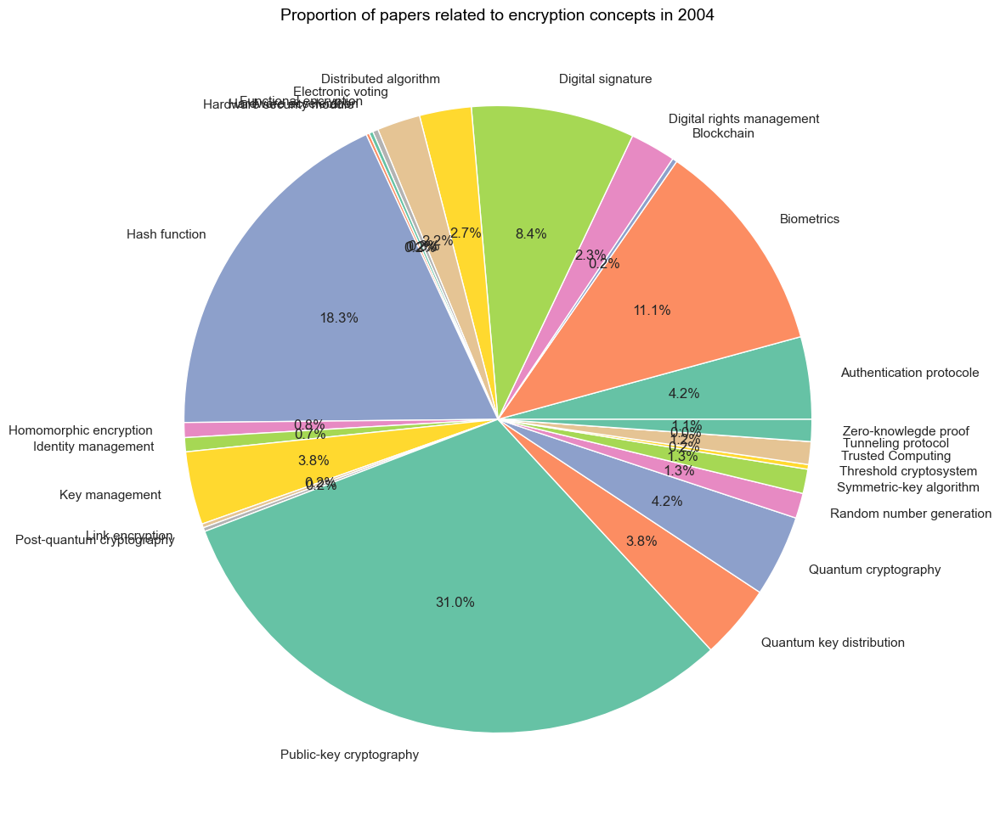

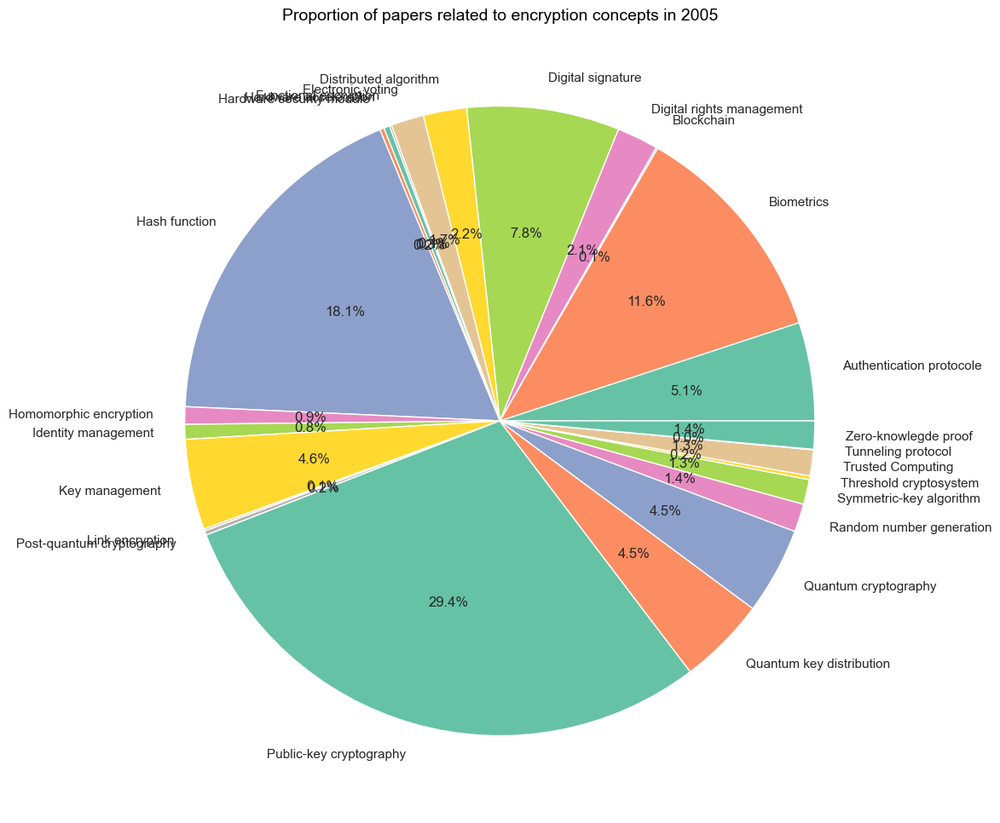

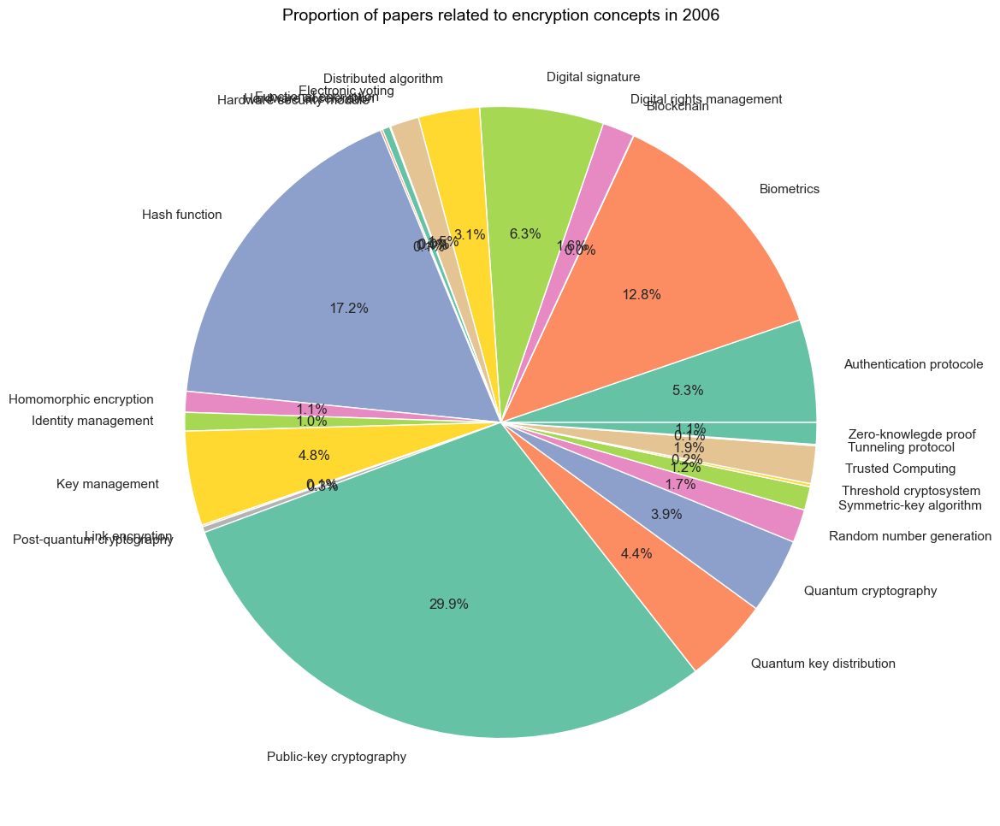

...

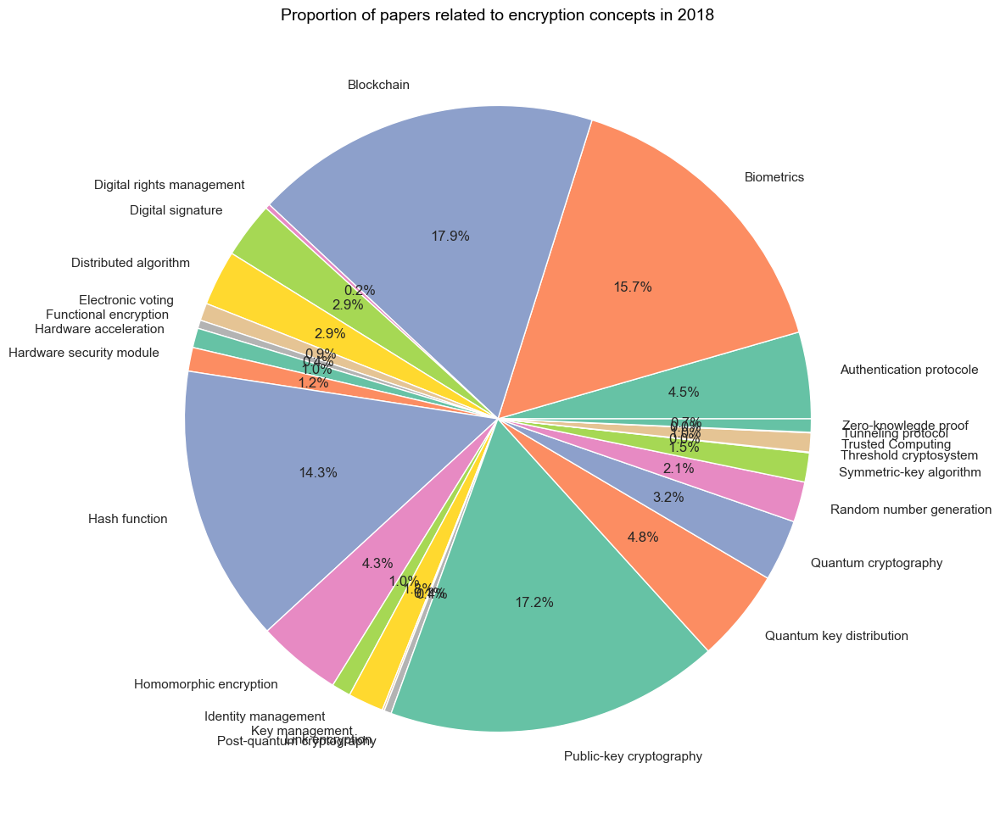

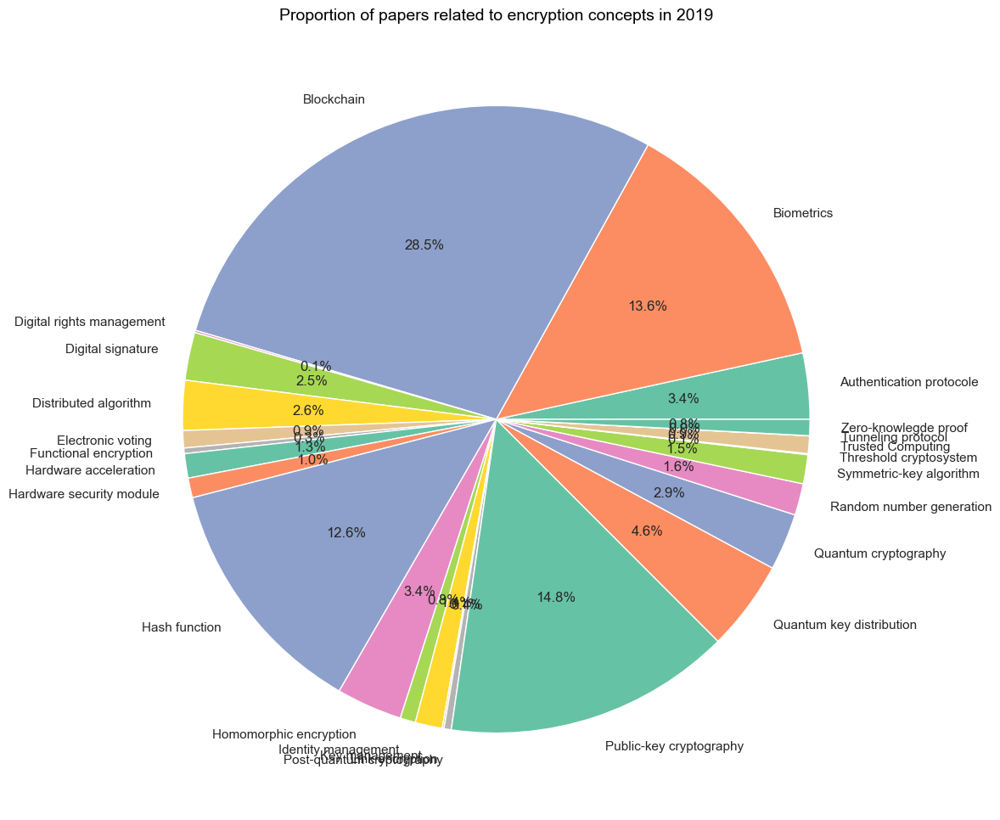

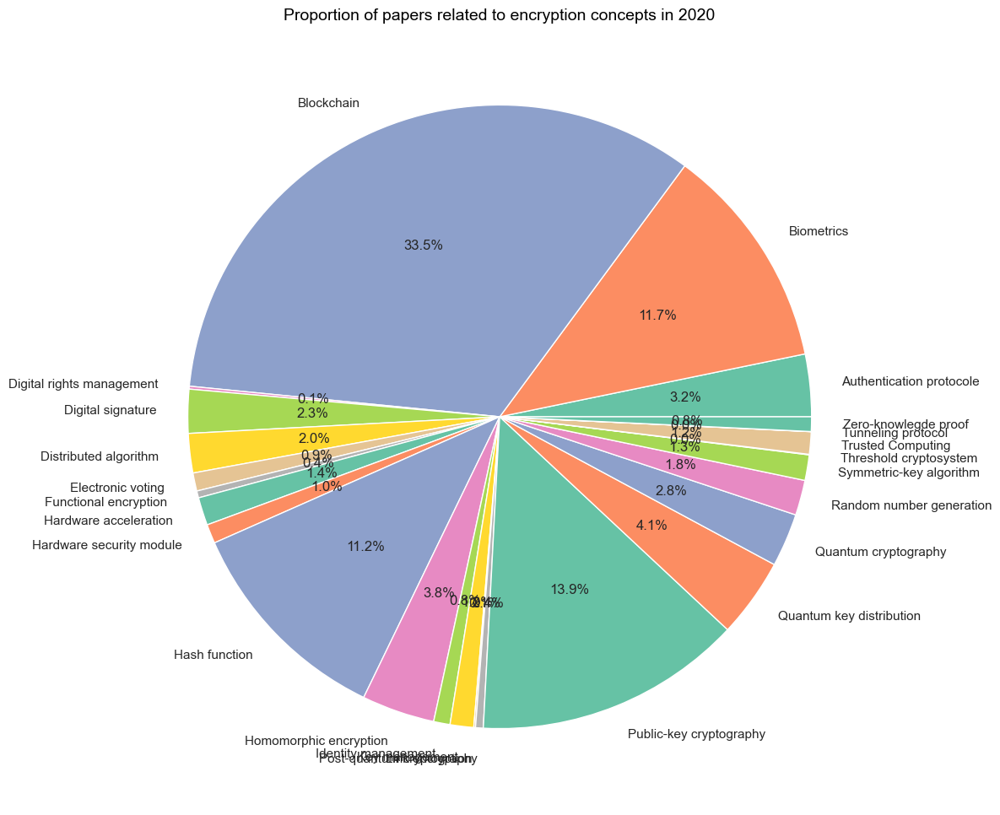

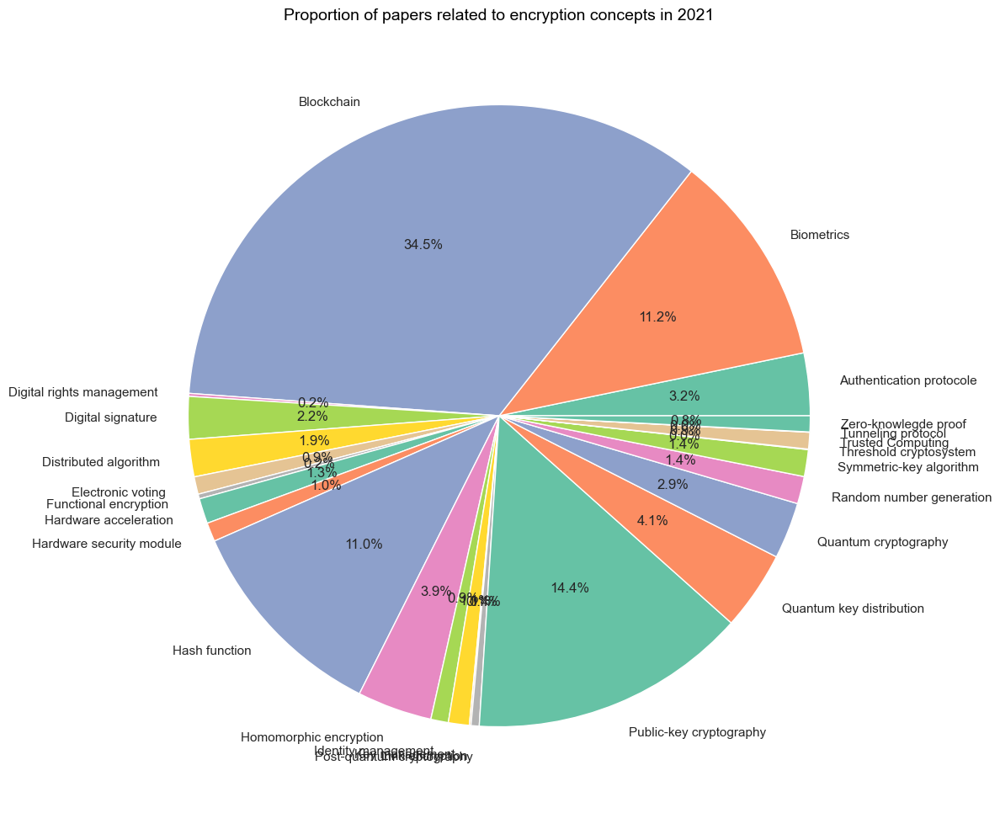

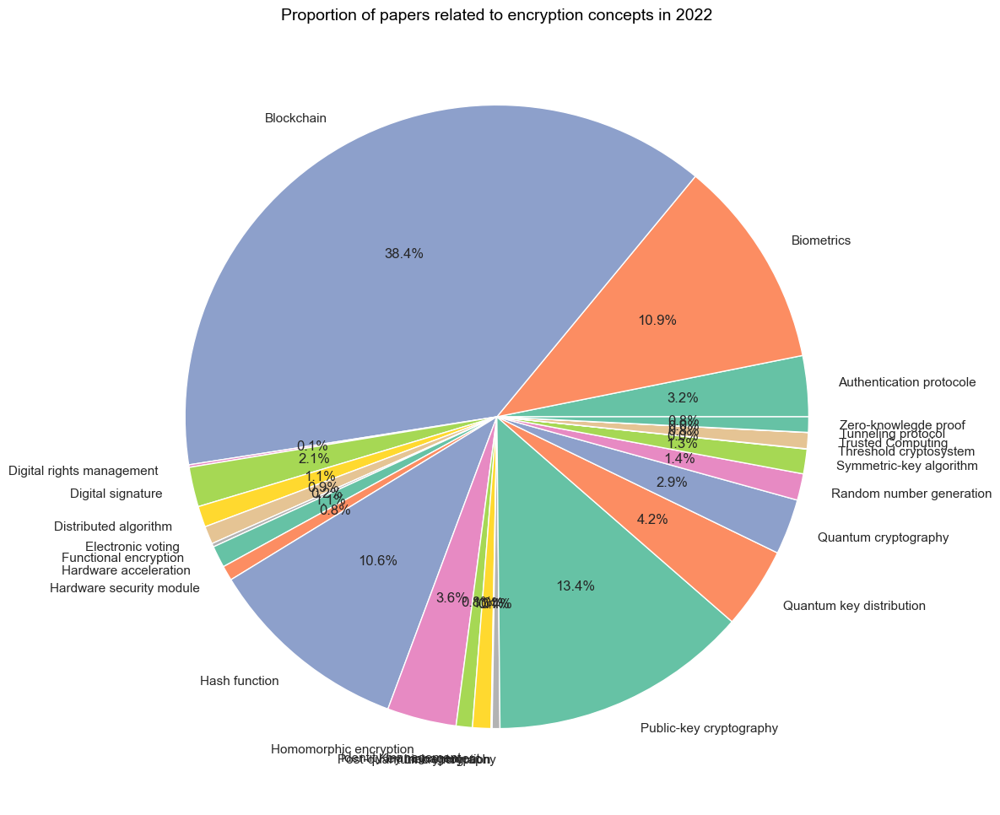

In [108]:
# little fancy visualization of the proportion of distribution of the publication of papers over all the years

my_years = [2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022]


for year in my_years:
    dfyear = dfconcepts.loc[dfconcepts["year"]==year].copy()
    papers_bytech = []
    for tech in list_concepts_withpapers:
        newdf = dfyear.loc[dfyear["technologies"]==tech].copy()
        nonzeropapers = newdf.loc[newdf["score"]!=0].copy()
        papers_bytech.append(len(nonzeropapers))    
    # colors
    colors = sns.color_palette("Set2")

    f = plt.figure()
    f.set_figwidth(12)
    f.set_figheight(12)
    # creating the pie chart
    plt.pie(papers_bytech, labels =list_concepts_withpapers, colors=colors, autopct="%0.1f%%")


    # title
    plt.title(
    "Proportion of papers related to encryption concepts in "+str(year),
    color="black",  # I am using the 'white' color here, as I am using the 'dark mode' of Jupyter Lab.
    fontsize=14)


    # calling the pie chart
    plt.show()

__Observation__

We see that some topics had a huge proportion of papers like 'hash function' at the beginning but with the time their importance decreases. While for blockchain this is completely the opposite and now blockchain definitely became central.


_Sidenote_

These pie charts do not directly show the proportion of papers related to technologies. In fact the same paper is counted in all the technologies to which he has a non-zero score of attribution. But overall this already gives a good idea of what is going on!

<div class="alert-info">
6. Correlation analysis
</div>

In [109]:
infile_dicofconcepts = open('../creation_data_and_variables/data_creation_variables/dicofconcepts','rb')
dfconcepts = pickle.load(infile_dicofconcepts)
infile_dicofconcepts.close()

In [110]:
dfconcepts

,paper,technologies,score,publication_date,year,month
0,https://openalex.org/W2885223756,Authentication protocole,0,2018-08-16,2018,August
1,https://openalex.org/W2885223756,Biometrics,0,2018-08-16,2018,August
2,https://openalex.org/W2885223756,Blockchain,0.92650795,2018-08-16,2018,August
3,https://openalex.org/W2885223756,Differential Privacy,0,2018-08-16,2018,August
4,https://openalex.org/W2885223756,Digital rights management,0.714638,2018-08-16,2018,August
...,...,...,...,...,...,...
3657091,https://openalex.org/W4214588288,Symmetric-key algorithm,0,2021-10-01,2021,October
3657092,https://openalex.org/W4214588288,Threshold cryptosystem,0,2021-10-01,2021,October
3657093,https://openalex.org/W4214588288,Trusted Computing,0,2021-10-01,2021,October
3657094,https://openalex.org/W4214588288,Tunneling protocol,0,2021-10-01,2021,October


We change the type of some variables in order to visualize the information we are interested in.

In [111]:
dfconcepts.score = dfconcepts.score.astype(float)

In [112]:
from pandas.api.types import CategoricalDtype

In [113]:
my_months = ['January','February','March','April','May','June','July','August','September','October','November','December']

The code below allows us to see the information about the month ordered in the natural order of the months.

In [114]:
cat_dtype = CategoricalDtype(
    categories=my_months, ordered=True)
dfconcepts['month']=dfconcepts['month'].astype(cat_dtype)

In [115]:
dfconcepts

,paper,technologies,score,publication_date,year,month
0,https://openalex.org/W2885223756,Authentication protocole,0.000000,2018-08-16,2018,August
1,https://openalex.org/W2885223756,Biometrics,0.000000,2018-08-16,2018,August
2,https://openalex.org/W2885223756,Blockchain,0.926508,2018-08-16,2018,August
3,https://openalex.org/W2885223756,Differential Privacy,0.000000,2018-08-16,2018,August
4,https://openalex.org/W2885223756,Digital rights management,0.714638,2018-08-16,2018,August
...,...,...,...,...,...,...
3657091,https://openalex.org/W4214588288,Symmetric-key algorithm,0.000000,2021-10-01,2021,October
3657092,https://openalex.org/W4214588288,Threshold cryptosystem,0.000000,2021-10-01,2021,October
3657093,https://openalex.org/W4214588288,Trusted Computing,0.000000,2021-10-01,2021,October
3657094,https://openalex.org/W4214588288,Tunneling protocol,0.000000,2021-10-01,2021,October


In [116]:
dfconcepts.dtypes

paper                 object
technologies          object
score                float64
publication_date      object
year                   int64
month               category
dtype: object

In [117]:
heatmap_data = pd.pivot_table(
    dfconcepts, values="score", index="month", columns="year", aggfunc=np.sum
)
heatmap_data

year,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
month,,,,,,,,,,,,,,,,,,,,,
January,13.673472,66.012507,129.144212,154.094084,226.665962,256.445038,228.958806,298.099441,302.782793,384.909913,...,392.665135,483.649576,436.283224,379.278865,431.515102,588.317520,806.324935,943.389096,983.897671,545.480414
February,14.271325,34.372735,60.137006,108.311921,108.120450,104.457725,147.712010,184.045534,214.589325,209.129228,...,304.281881,298.251296,334.284765,259.027194,221.557707,290.892481,376.183991,531.975343,769.122384,492.311372
March,10.021976,19.899356,89.557482,126.610292,141.980494,142.385014,226.364410,250.265353,257.130409,303.104990,...,346.701115,415.838976,377.150432,394.996334,321.792317,346.349678,520.134599,587.987960,929.937361,626.068608
April,8.368504,45.334765,69.694992,122.300749,207.252549,210.749225,253.172017,284.234664,315.683377,298.085194,...,371.250798,326.974395,399.194990,305.745079,336.247744,392.516427,534.098984,568.212708,875.715692,650.330894
May,11.083747,52.910544,128.568994,157.394701,194.784030,221.269290,237.166545,327.204691,332.652832,337.791734,...,405.041084,463.046474,456.597486,368.452535,382.605164,464.001863,606.156024,624.331636,1017.557652,739.713942
June,13.522054,60.042446,107.078101,133.802196,145.521057,264.636877,265.735682,394.865333,376.614877,390.959158,...,467.654220,452.033086,412.603836,333.457041,393.064773,498.389030,688.038956,797.338052,976.745584,676.285116
July,15.044711,47.015345,81.638140,168.018542,135.020561,227.972684,185.580459,251.868605,335.054361,356.154932,...,444.340535,364.951003,382.946198,349.141773,397.722959,561.754365,774.151071,759.665345,954.080812,582.313367
August,15.799950,44.751025,104.887948,128.317992,200.688427,256.961691,208.815897,298.247973,294.705508,276.647164,...,324.495116,384.413436,401.211129,419.270760,381.310601,460.576465,522.586902,586.878450,840.763898,591.349832
September,20.263226,62.384856,93.116057,150.713994,224.261768,203.237307,219.737047,351.119001,302.645446,297.589069,...,431.879053,425.607159,384.727216,402.508940,387.412702,503.958839,656.817182,804.501525,974.669681,701.544929


heatmap_data = pd.pivot_table(
    dfconcepts, values="score", index="month", columns="year", aggfunc=np.sum
)
heatmap_data

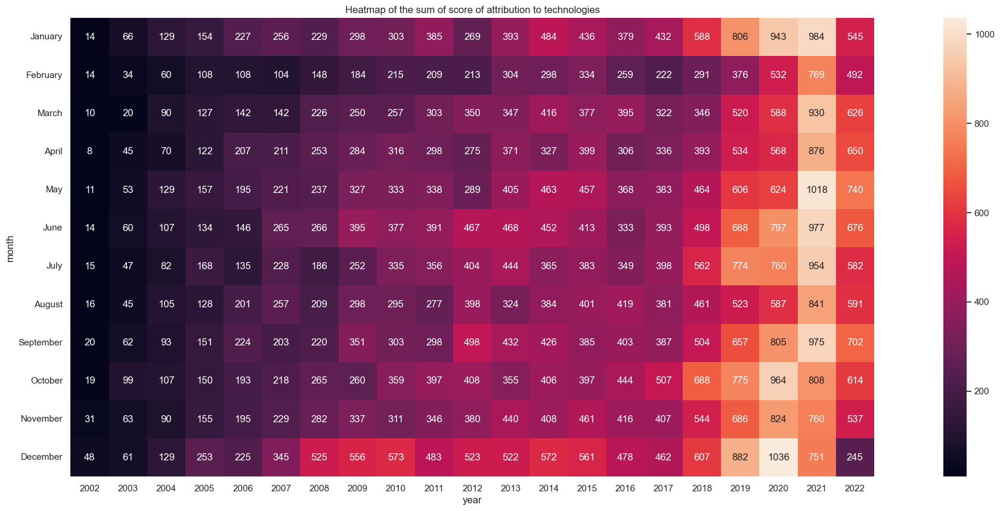

In [118]:
sns.set(rc={"figure.figsize": (30, 10)})
sns.heatmap(heatmap_data, annot=True, square=True, fmt=".0f").set(
    title="Heatmap of the sum of score of attribution to technologies"
)
plt.show()

__Observations__

We see that the sum increases over the years, and that it remains quite constant over the months. This is due to the increase of publication over the years.

We now do a heatmap with the average of the scores of attribution.

In [119]:
heatmap_data = pd.pivot_table(
    dfconcepts, values="score", index="month", columns="year", aggfunc=np.mean
)
heatmap_data

year,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
month,,,,,,,,,,,,,,,,,,,,,
January,0.028135,0.028102,0.029344,0.027307,0.025991,0.026830,0.027355,0.027329,0.027621,0.028398,...,0.025786,0.026189,0.025649,0.026208,0.026504,0.027169,0.028771,0.029838,0.028648,0.027412
February,0.026428,0.025461,0.025601,0.026923,0.025028,0.023447,0.025328,0.024878,0.025888,0.023614,...,0.025044,0.026114,0.026010,0.023865,0.025484,0.025114,0.025706,0.026589,0.027470,0.028052
March,0.024746,0.022334,0.024570,0.024297,0.024458,0.024414,0.023886,0.023585,0.024930,0.024619,...,0.027148,0.025798,0.025260,0.024838,0.023647,0.025103,0.027520,0.026493,0.027709,0.027057
April,0.019372,0.023649,0.022062,0.025026,0.025333,0.025018,0.025005,0.025185,0.024771,0.024698,...,0.024909,0.024465,0.023138,0.025447,0.023766,0.024109,0.026588,0.026208,0.027650,0.027685
May,0.025657,0.026845,0.025464,0.024701,0.025765,0.026351,0.025314,0.025090,0.026158,0.025742,...,0.024472,0.024535,0.025392,0.025178,0.023896,0.025198,0.026663,0.025779,0.026920,0.027730
June,0.020033,0.024172,0.023748,0.024778,0.023332,0.025132,0.024605,0.025302,0.024776,0.024965,...,0.024499,0.024548,0.024608,0.024553,0.023633,0.024514,0.026407,0.027118,0.026937,0.027464
July,0.020637,0.020980,0.023439,0.023394,0.021933,0.023133,0.022316,0.023090,0.024769,0.025713,...,0.025087,0.024267,0.023837,0.022528,0.023721,0.025910,0.026209,0.026618,0.026449,0.027721
August,0.018287,0.021525,0.021228,0.022105,0.022941,0.022933,0.023155,0.023704,0.023677,0.023554,...,0.023246,0.024009,0.022756,0.023744,0.023816,0.025964,0.025169,0.025663,0.026146,0.027377
September,0.023453,0.022217,0.021690,0.022599,0.023331,0.021507,0.022236,0.024038,0.023255,0.022402,...,0.022371,0.021954,0.022404,0.023403,0.023835,0.026475,0.026046,0.026368,0.027061,0.026677


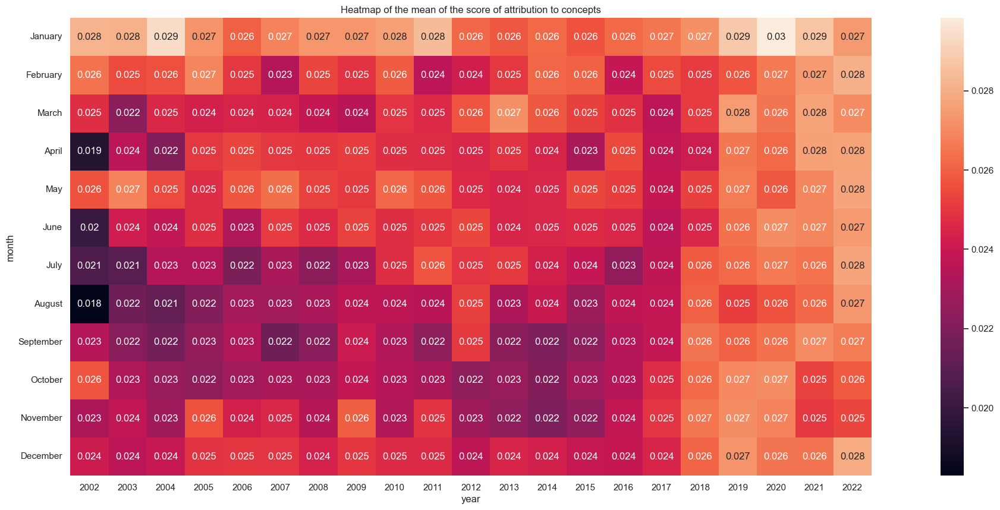

In [120]:
sns.set(rc={"figure.figsize": (30, 10)})
sns.heatmap(heatmap_data, annot=True, square=True).set(
    title="Heatmap of the mean of the score of attribution to concepts"
)
plt.show()

__Observation__

The mean remain very constant over all the years and months. Nothing special to say, we see that the mean of the score of attribution for all technologies is an invariant over time.

Since there are approximatively 96% of the score of attributions to technologies that are 0, we now do a heatmap with the average of the scores of attribution without all these zeroes.

In [121]:
dfconcepts_nozero = dfconcepts.loc[dfconcepts['score']!=0]

In [122]:
heatmap_data = pd.pivot_table(
    dfconcepts_nozero, values="score", index="month", columns="year", aggfunc=np.mean
)
heatmap_data

year,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,...,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022
month,,,,,,,,,,,,,,,,,,,,,
January,0.488338,0.511725,0.478312,0.513647,0.512819,0.529845,0.561174,0.548986,0.596029,0.565213,...,0.598575,0.624870,0.595202,0.571203,0.624479,0.642268,0.686819,0.731309,0.699785,0.639485
February,0.419745,0.520799,0.518422,0.506130,0.540602,0.546899,0.541070,0.504234,0.517083,0.510071,...,0.595464,0.518698,0.498189,0.537401,0.562329,0.577168,0.605771,0.619296,0.630428,0.631979
March,0.455544,0.585275,0.505974,0.550480,0.529778,0.531287,0.525207,0.518148,0.537930,0.531763,...,0.508359,0.498011,0.534207,0.552442,0.523240,0.567786,0.612644,0.601215,0.643110,0.638194
April,0.492265,0.509379,0.512463,0.522653,0.522047,0.537626,0.539812,0.526360,0.532350,0.539033,...,0.518507,0.535146,0.532971,0.552884,0.539724,0.547443,0.609702,0.620320,0.633658,0.652288
May,0.503807,0.523867,0.524771,0.493400,0.535121,0.535761,0.550270,0.535523,0.537404,0.537885,...,0.521288,0.534696,0.556148,0.552403,0.541167,0.573550,0.614140,0.595168,0.623503,0.625816
June,0.450735,0.508834,0.493447,0.524714,0.517869,0.530334,0.518003,0.539434,0.528212,0.552983,...,0.540641,0.542006,0.554575,0.544864,0.530452,0.568937,0.617075,0.626346,0.584878,0.635606
July,0.501490,0.460935,0.500847,0.513818,0.492776,0.495593,0.488370,0.509855,0.517858,0.526856,...,0.542540,0.525866,0.518897,0.512690,0.533141,0.593194,0.595043,0.607246,0.600051,0.632949
August,0.493748,0.476075,0.490131,0.478798,0.489484,0.508835,0.505607,0.508956,0.527201,0.517098,...,0.496170,0.515300,0.500263,0.517618,0.543952,0.578614,0.564349,0.597028,0.599689,0.584916
September,0.450294,0.476220,0.479980,0.490925,0.503959,0.489728,0.498270,0.538526,0.498592,0.505245,...,0.502770,0.489767,0.494508,0.529617,0.559037,0.591501,0.598739,0.605799,0.603511,0.605825


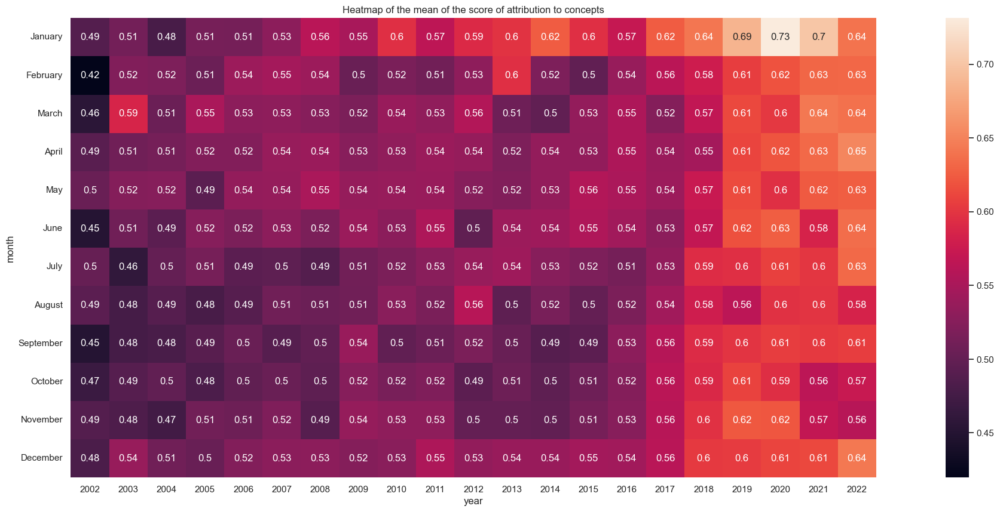

In [123]:
sns.set(rc={"figure.figsize": (30, 10)})
sns.heatmap(heatmap_data, annot=True, square=True).set(
    title="Heatmap of the mean of the score of attribution to concepts"
)
plt.show()

__Observation__

We now see, that in fact the mean increases slightly over all the years and months. This means that the papers belongs more and more to the technologies they are related to. This is probably due to the increase of interconnectivity within our network, that we already noticed before.

We now visualize a heatmap of the mean for every technology.

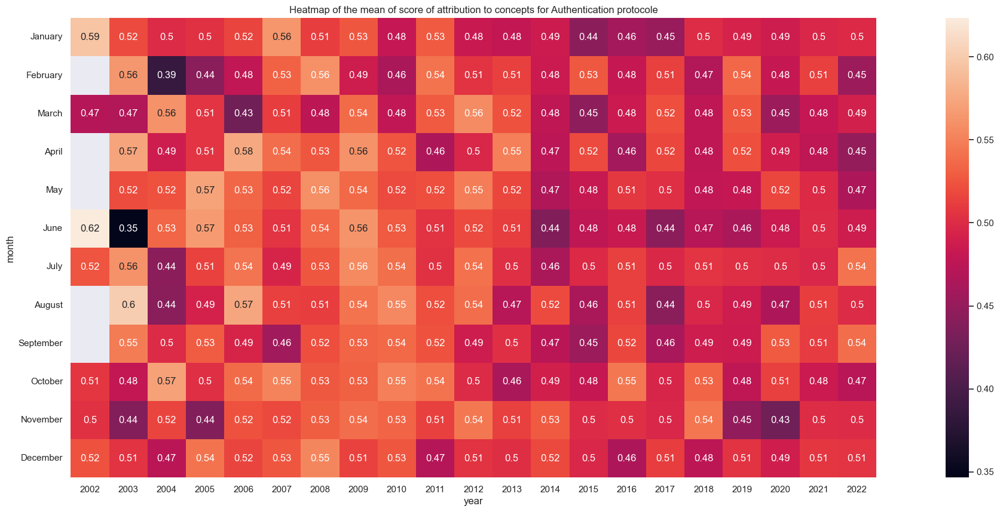

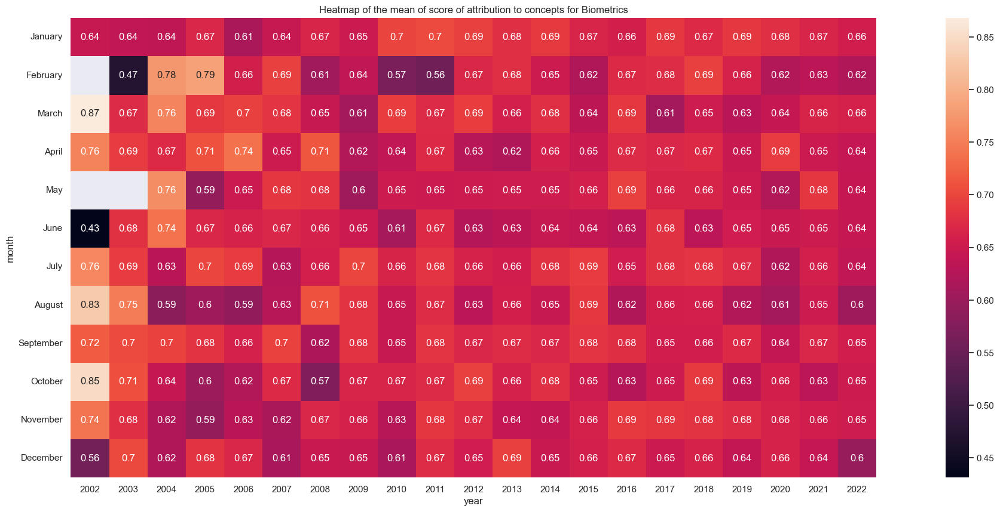

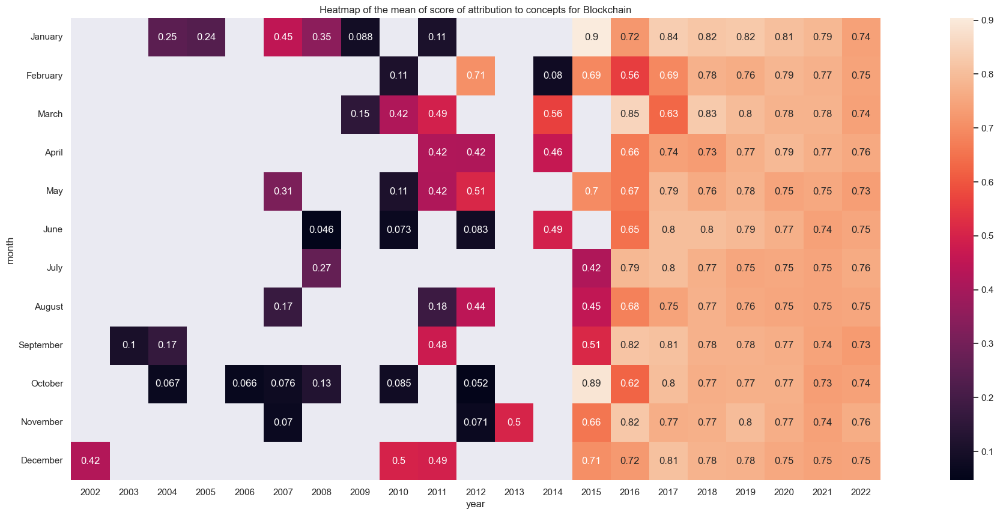

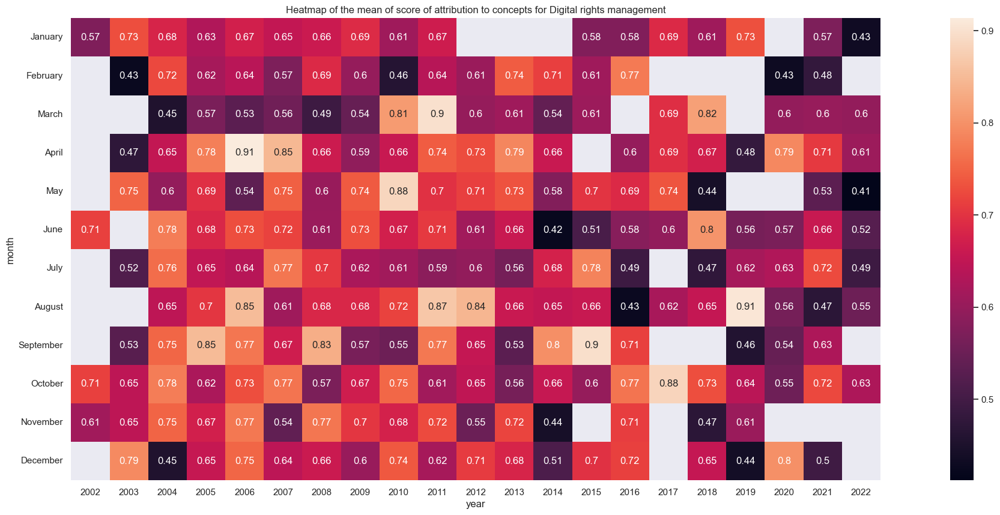

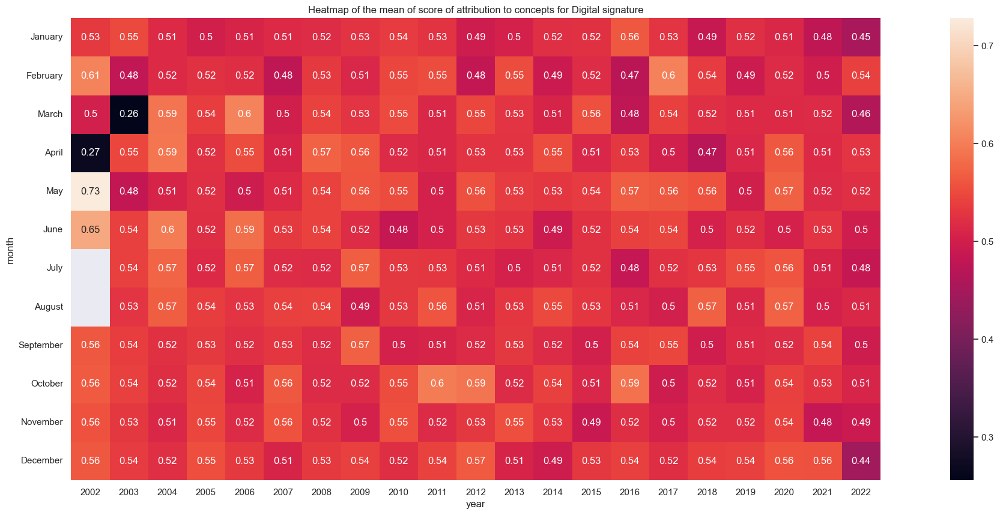

...

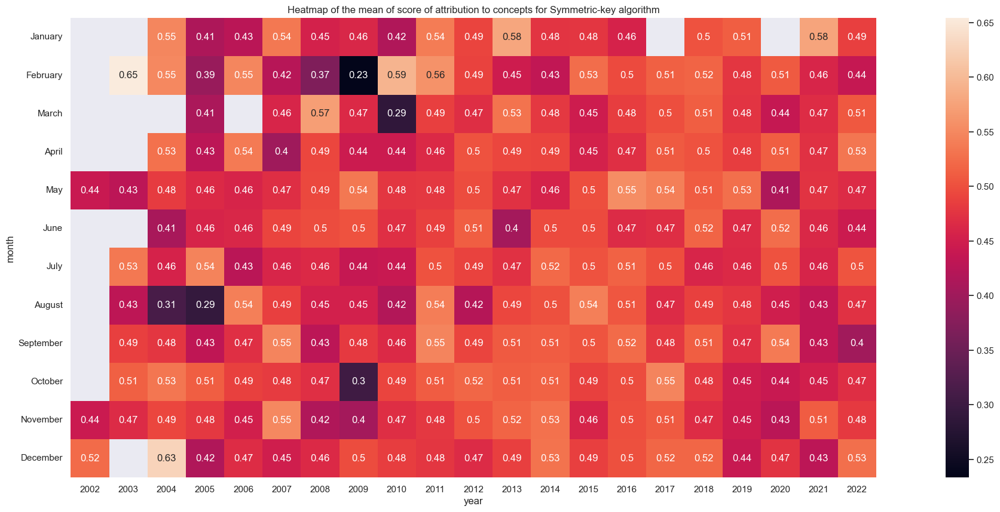

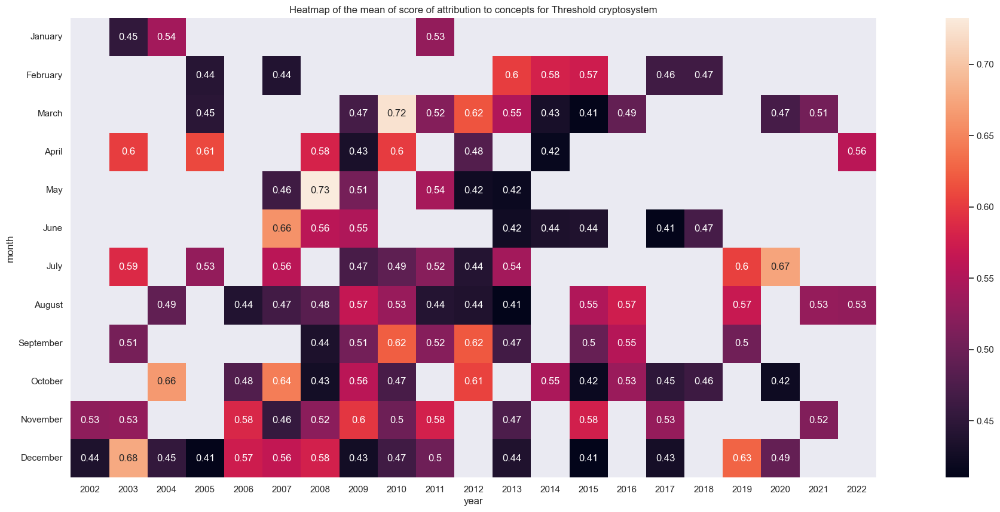

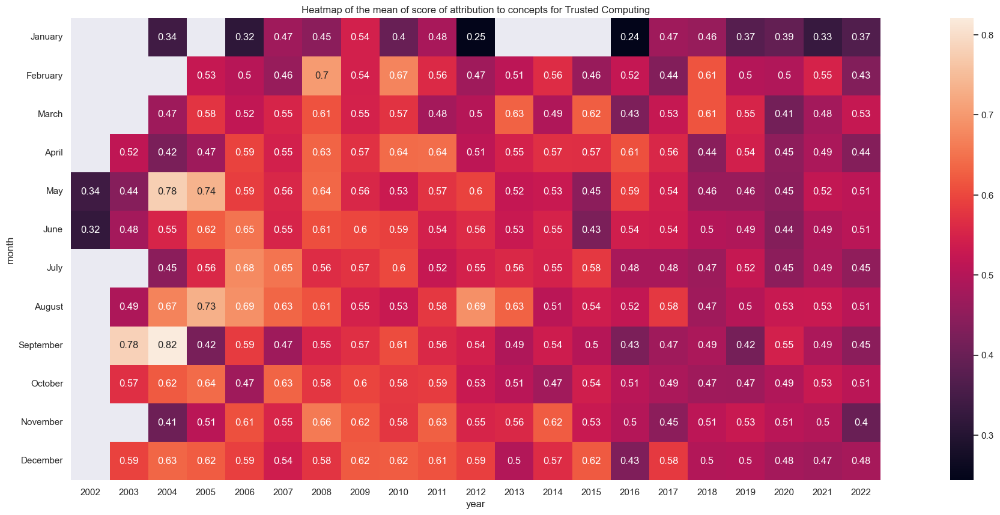

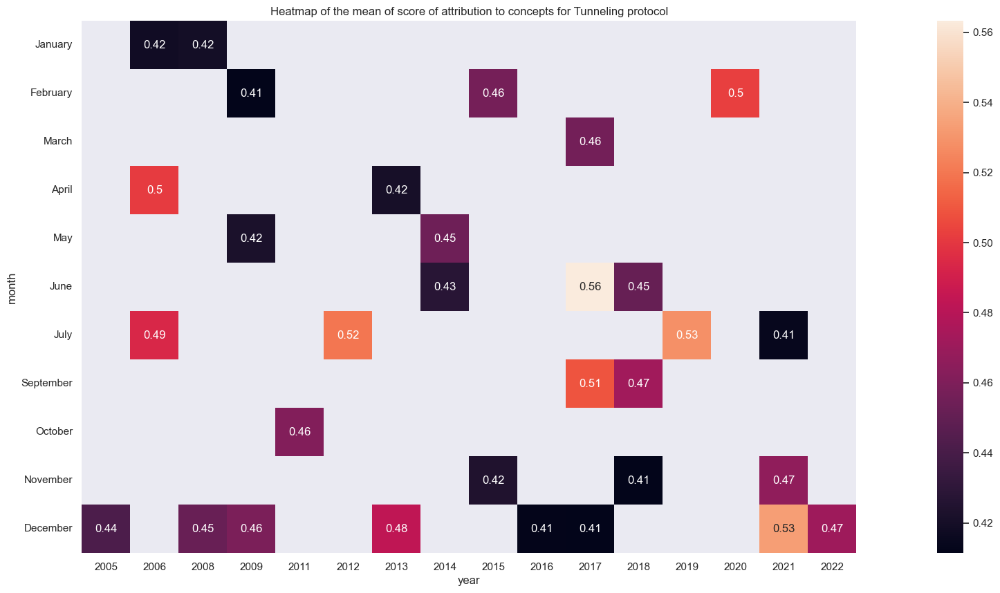

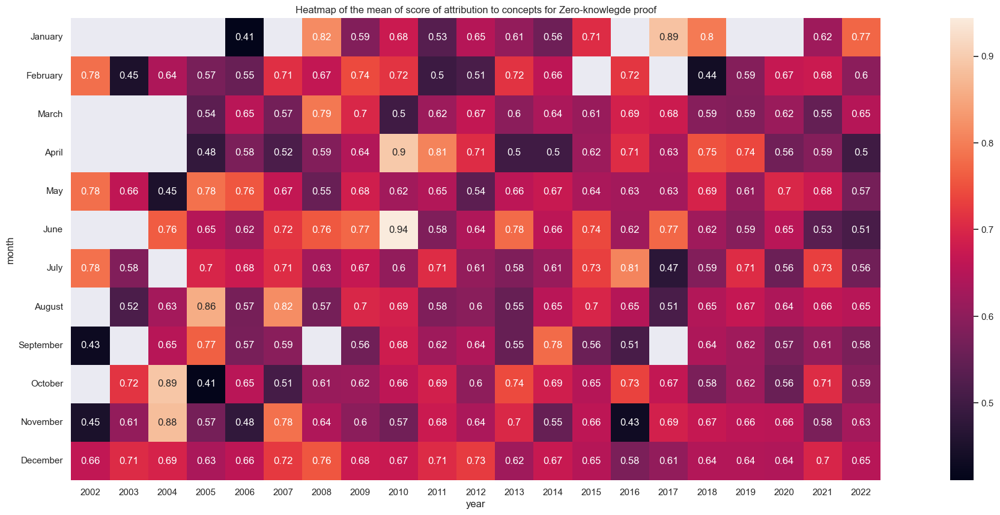

In [124]:
list_concepts_withpaper= ['Authentication protocole','Biometrics','Blockchain','Digital rights management',
'Digital signature','Distributed algorithm','Electronic voting','Functional encryption',
'Hardware acceleration','Hardware security module','Hash function','Homomorphic encryption','Identity management',
'Key management','Link encryption','Post-quantum cryptography','Public-key cryptography','Quantum key distribution',
'Quantum cryptography','Random number generation','Symmetric-key algorithm','Threshold cryptosystem',
'Trusted Computing','Tunneling protocol','Zero-knowlegde proof']

for tech in list_concepts_withpaper:
    dfmyconcept0 = dfconcepts.loc[dfconcepts['technologies']==tech]
    dfmyconcept = dfmyconcept0.loc[dfmyconcept0['score']!=0]

    heatmap_data = pd.pivot_table(
    dfmyconcept, values="score", index="month", columns="year", aggfunc=np.mean
    )
    sns.set(rc={"figure.figsize": (30, 10)})
    sns.heatmap(heatmap_data, annot=True, square=True).set(
    title="Heatmap of the mean of score of attribution to concepts for "+str(tech)
    )
    plt.show()

__Observations__

Overall the mean of the score of attribution for each technology, does not seem to change much over time. It is, of course, different for each technology, but then it remains quite constant over time. Some technologies have missing data for certain months. This makes it much more visible.

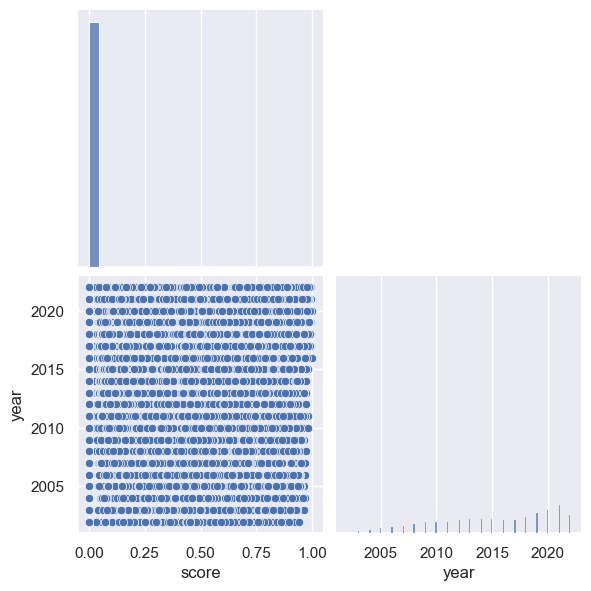

In [125]:
sns.pairplot(dfconcepts, height=3,corner=True)
plt.show()

__Observations__

In the left corner top, since most of the score of attributions are zero (~96%), we simply do not see the rest. The right corner at the bottom, shows the increase of published papers with time.
In the remaining graphics, we can see that the score of attribution are distributed from 0 to 1 for all the years (even though there is a little increase with time, since in 2012 the maximal score of attribution were not exactly 1).

In [126]:
dfconcepts.corr()

,score,year
score,1.00000,0.00782
year,0.00782,1.00000


In [127]:
corr_df = pd.DataFrame(np.tril(dfconcepts.corr()))

In [128]:
corr_df_lowtriangular = corr_df.where(np.tril(np.ones(corr_df.shape)).astype(bool))

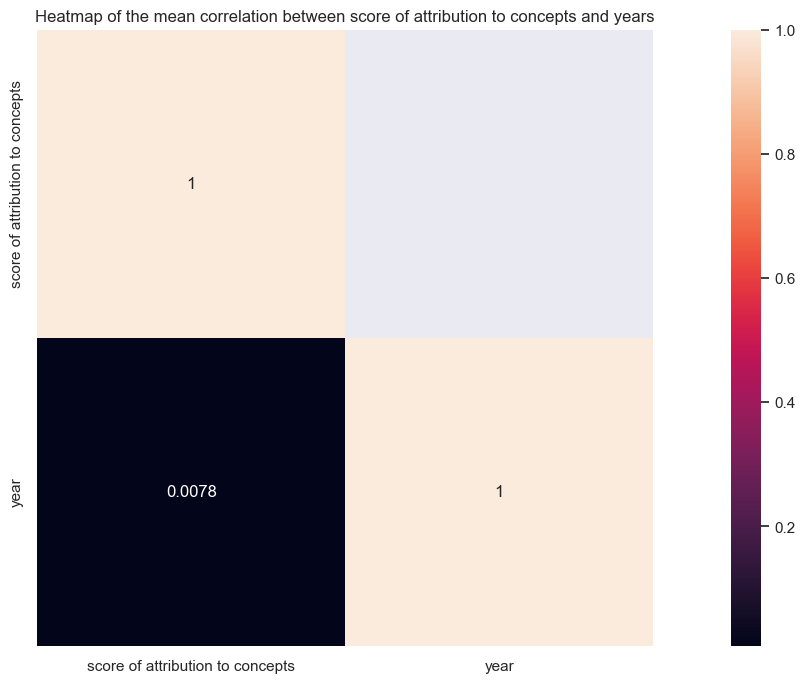

In [129]:
sns.set(rc={"figure.figsize": (20, 8)})
sns.heatmap(corr_df_lowtriangular, annot=True, square=True).set(
title="Heatmap of the mean correlation between score of attribution to concepts and years",
xticklabels=['score of attribution to concepts','year'],
yticklabels=['score of attribution to concepts','year']
)
plt.show()

__Observation__

As done before, the variables ```year``` and ```score_concepts``` are not correlated. Nevertheless, this was a good exercise, to see how one can manipulate these computational tools. 